<a href="https://colab.research.google.com/github/SimplyDifficult/Codeforces/blob/master/16.Noisy6_20_dim_user_case_BOGP_p%3D40.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
P_max = 40 #in dBm

In [2]:
var = 20
number_of_cells = 4

In [ ]:
!sudo add-apt-repository ppa:octave/stable
!sudo apt update
!sudo apt install octave

In [ ]:
!wget https://www.dropbox.com/s/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
!wget https://www.dropbox.com/s/d1ytzzfpxsrpbcv/main_bitchanged.m -O /content/main.m
!wget https://www.dropbox.com/s/v3y2xe56qodthnm/function_SE.m
!wget https://www.dropbox.com/s/5p0j4qdqist7ibm/main_individual_transmit_case_for_Test_phase_bitchanged.m -O /content/main_individual_transmit_case_for_Test_phase.m

In [5]:
from numpy import arange
from numpy import vstack
from numpy import argmax
from numpy import asarray
from numpy.random import normal
from scipy.stats import norm
from sklearn.gaussian_process import GaussianProcessRegressor
from warnings import catch_warnings
from warnings import simplefilter
from matplotlib import pyplot
from scipy.optimize import minimize
import numpy as np
from scipy.io import loadmat, savemat
import numpy as np
from google.colab import files
import cv2
from scipy.optimize import dual_annealing

In [6]:
import warnings
warnings.filterwarnings('ignore')

In [7]:
#### Objective function
import random
def objective(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W main.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [8]:
#surrogate or approximation for the objective function
def surrogate(model, X):
	#catch any warning generated when making a prediction
	with catch_warnings():
		#ignore generated warnings
		simplefilter("ignore")
		return model.predict(X, return_std=True)

In [9]:
def UCBobjective(Xsamples, X, model, beta):
  Xsamples = Xsamples[np.newaxis,:]
  mu, std = surrogate(model, Xsamples)
  mu = mu[:, 0]
  sigma = beta
  probs = mu + sigma * std
  return -probs[0]

In [10]:
#optimize the acquisition function
def opt_acquisition(X, y, model, iteration):
  #Do it 5 times
  r_min, r_max = -31.0, P_max  
  bounds = []
  for ti in range(var):
    bounds = bounds + [[r_min, r_max]]
  min_result = 9999999999999.0
  min_answer = 0
  beta=0.2
  
  for i in range(5):
    result = dual_annealing(UCBobjective, bounds, args=(X,model,beta))
    if(result.fun<min_result):
      min_result = result.fun
      min_answer = result['x']    
  return min_answer

In [11]:
import random
def objective_FPA(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W /content/main_individual_transmit_case_for_Test_phase.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [12]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
X = np.load("/content/drive/MyDrive/trainingx_BOGP_noisy_6.npy")
y = np.load("/content/drive/MyDrive/trainingy_BOGP_noisy_6.npy")
y_FPA = np.load("/content/drive/MyDrive/grad_trainingyFPA_BOGP_noisy_6.npy")

x_next is [-13.33179394 -24.11757874   5.66134313 -26.64437544  32.77606809
  -9.67411077  26.32158905  -0.22828783 -26.72848689 -27.12822172
 -29.55159117  -3.32700711   3.55071174 -27.69571417 -10.33862234
 -20.52394499   7.53661325  23.83735247  -9.80999596  21.3251768 ]
f()=0.000000, actual=19.677
0


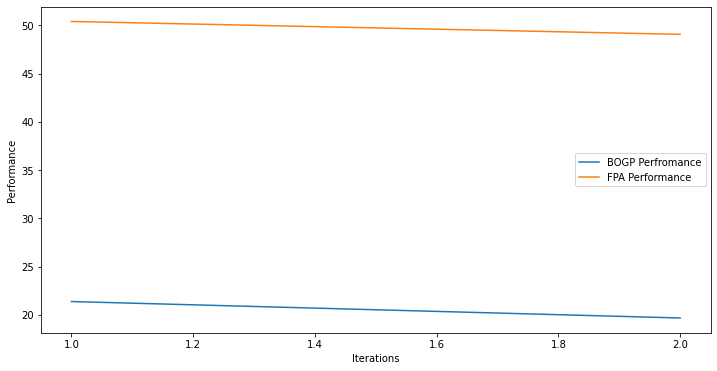

x_next is [-20.15289397 -16.14326949  39.22363156 -28.68926134  24.77384686
  11.37716747  18.90037484  11.95500471 -14.73202967 -25.91787421
 -13.85227931  13.02423806 -25.24089163 -18.07237262 -24.5992015
 -14.4007283    3.77572459   9.09902656 -20.26627989 -24.46430875]
f()=20.493193, actual=26.624
1


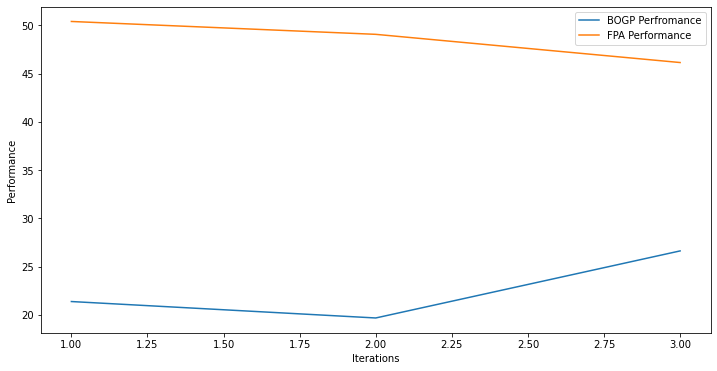

x_next is [ 22.34796366  29.11210458  32.48352495  32.23585619 -11.64121315
  15.4918689    9.56721489  29.69406873  -6.82595016  13.39781243
 -13.54041889 -24.04219587 -10.24349199 -16.54081813 -27.95983863
  -9.43520153  -3.73875611  34.4503397   28.82991186  -0.74213055]
f()=22.366671, actual=34.674
2


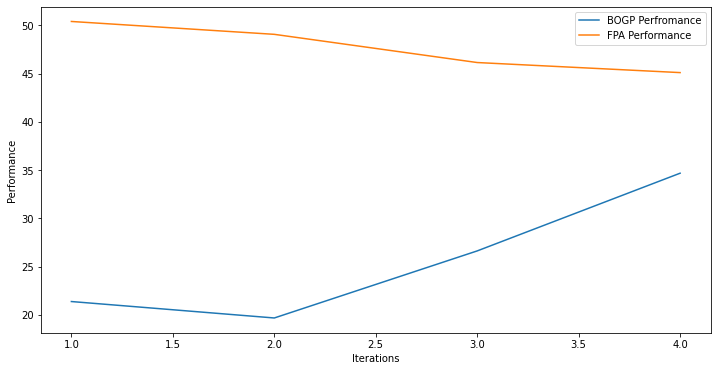

x_next is [ 39.99983127  39.99997456  39.99996551  39.99999193 -30.99984124
  39.99999249 -30.99992646  39.99991783  39.99995318  39.99998499
  39.99984727 -30.99989405 -30.99995873 -24.5095971  -30.99970273
  24.00877212 -30.99920011  39.99980567  39.99993783 -30.99994071]
f()=25.144936, actual=35.684
3


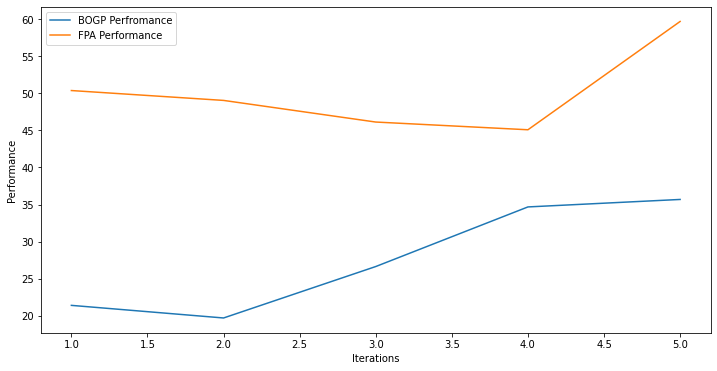

x_next is [ 31.66003631  30.79989816  26.15366398  36.91463049 -28.90606793
  38.74373287  -0.42195475  29.93535839  30.28523704  26.21999387
  33.75613594  10.1887097   35.84133209   7.23476122  30.45251037
  29.50531829  -0.62626704  -7.14849256 -22.1289829  -27.94116979]
f()=27.213286, actual=35.815
4


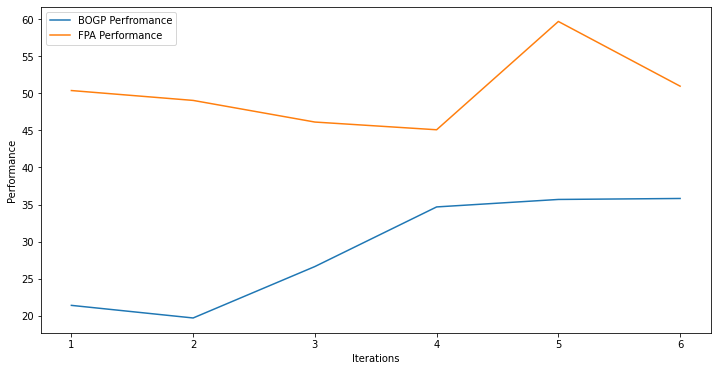

x_next is [ 40.          40.          40.          40.         -31.
  40.          40.          40.          40.          40.
  40.         -31.          37.20780168 -16.93299614 -31.
  40.         -14.45764697  40.          26.78279003 -31.        ]
f()=36.325159, actual=35.950
5


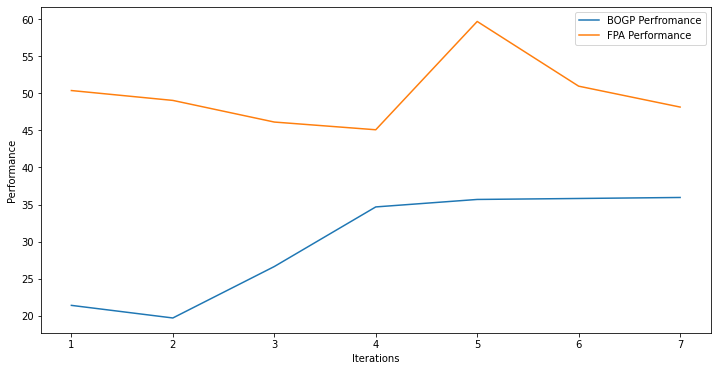

x_next is [ 40.          40.          40.          40.         -31.
  40.          28.60090013  40.          40.          40.
  40.         -27.64376578   0.17847033  -5.15559744 -31.
  40.         -10.10418902  40.          15.93151727 -31.        ]
f()=36.172919, actual=35.973
6


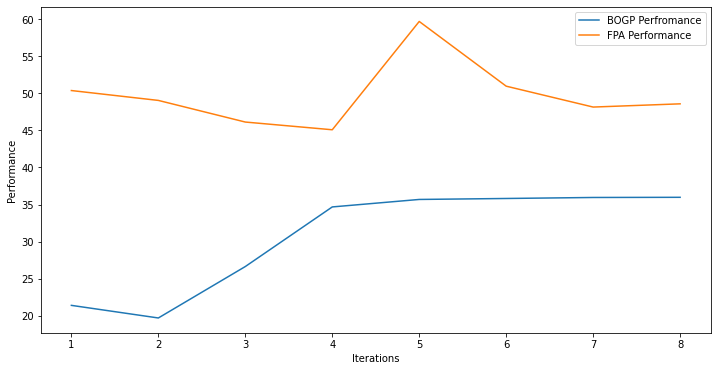

x_next is [ 39.96811217  39.96515996  39.93533592  39.96092976 -30.97332951
  39.85194085 -30.90208948  39.93284979  39.9795935   39.98116988
  39.9828807  -30.99029749  39.60729818  39.83436156 -30.93645213
  39.92019159 -30.51634993  39.9888935   39.92229888 -30.9919078 ]
f()=30.520299, actual=45.888
7


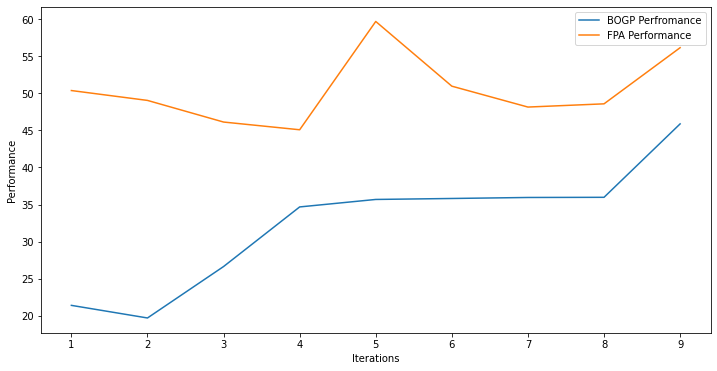

x_next is [ 40.          40.          40.          40.         -31.
  40.         -31.          40.         -22.35012287  38.64539196
 -31.         -24.36535867  40.          40.         -31.
   4.65980435 -31.          40.          40.         -31.        ]
f()=47.098099, actual=38.801
8


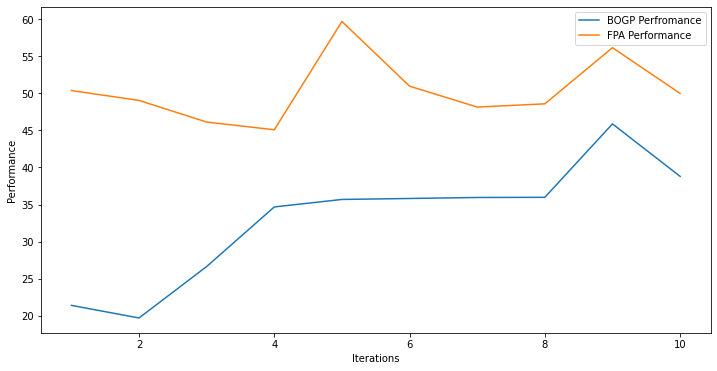

x_next is [ 13.63767804   7.41116662  34.96650054  24.77153516  36.87402742
  34.65336242 -22.12267601   4.2418622   -4.32751967 -11.52722447
 -13.68087517   8.47669546  32.75396693 -10.34329061  36.6945039
 -28.03838719  29.88741198 -16.37109176   6.6721916  -25.57331963]
f()=32.848732, actual=29.676
9


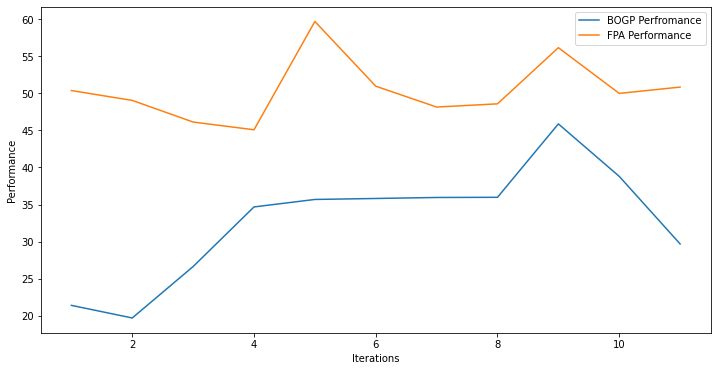

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=41.696274, actual=35.721
10


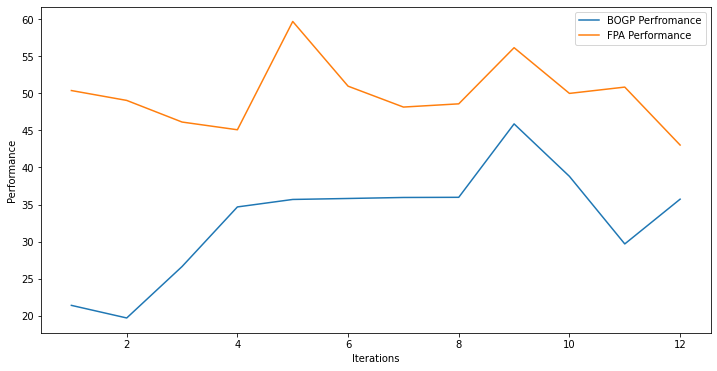

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=39.400960, actual=37.579
11


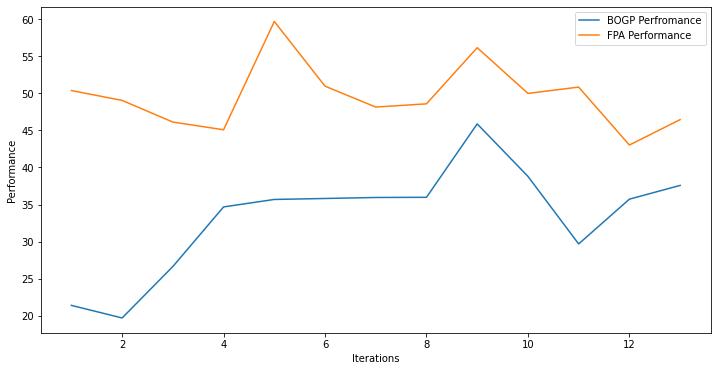

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=39.007341, actual=37.264
12


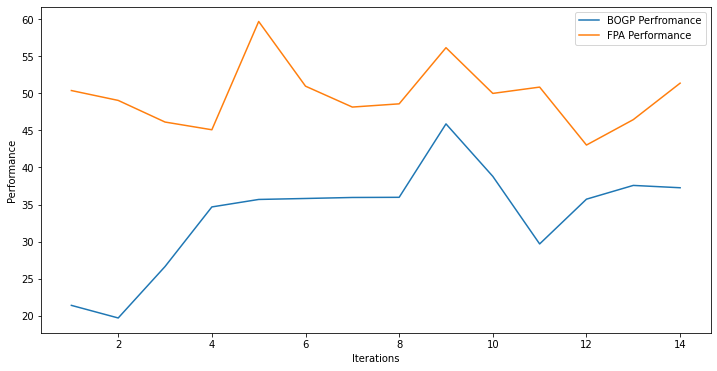

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=38.700021, actual=42.626
13


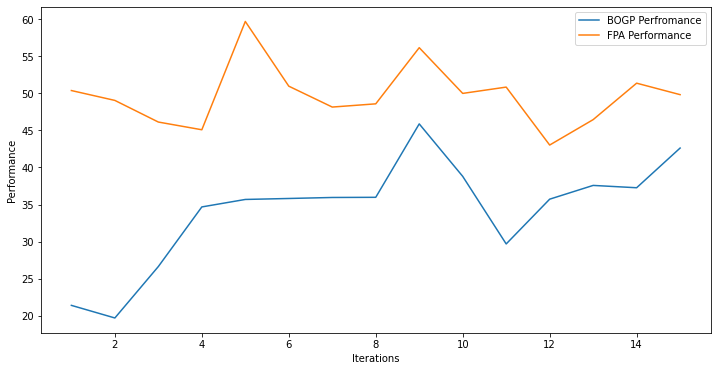

x_next is [-27.56860185  25.18345606  11.50342962 -29.22531517  14.54632613
 -20.786266   -30.9637992   -5.85213634   3.5964061   36.26989845
  -6.52869305 -21.64799265 -13.48628591  27.19168741  -8.52521871
   3.19374044  30.13045273  -6.06145343   2.85565725  -2.24353721]
f()=34.122482, actual=22.800
14


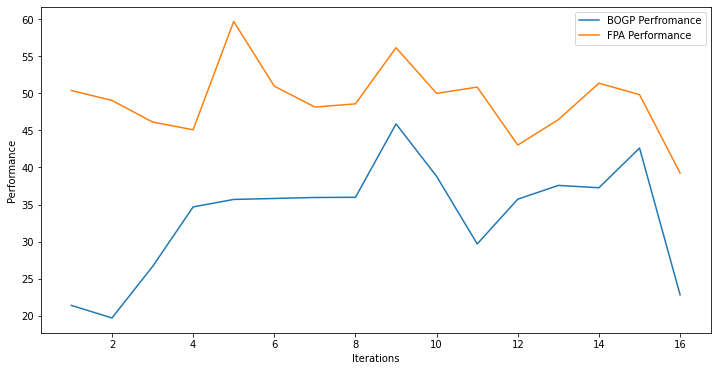

x_next is [-12.7089251   -3.86030937  33.04866469   4.873748     3.23866651
  16.57782842 -24.11474525  -9.06706722 -27.34139829  29.18056013
  28.2744259  -20.34210257 -21.28558334   1.01640065   2.64630963
 -27.90706607 -22.15806369 -16.6879614  -27.42954677 -15.05639081]
f()=33.404009, actual=20.472
15


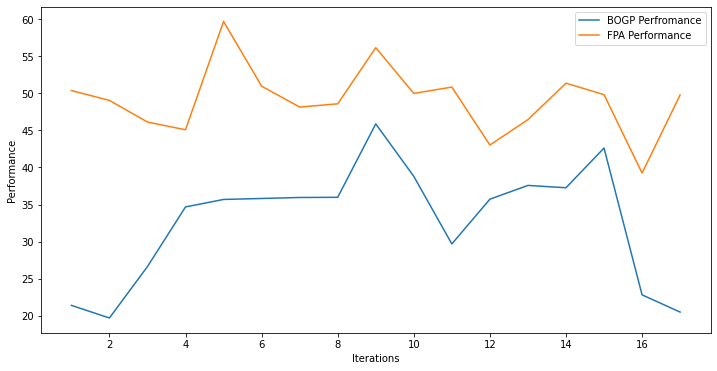

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=37.971696, actual=31.297
16


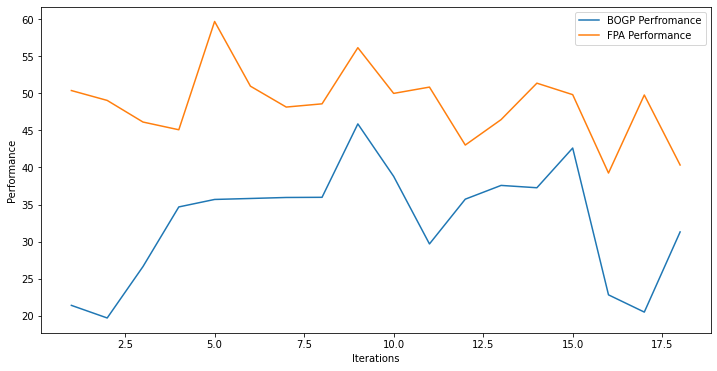

x_next is [ 39.99996454  39.99990107  39.99992002  39.99995201 -30.99969006
  39.99954493 -30.99994002  39.9998617   39.99997219  39.99996255
  39.99995335 -30.99995037  39.99991085  39.99998572 -30.9995781
  39.99988408 -30.99990054  39.99990699  39.99991433 -30.99980499]
f()=32.561103, actual=50.255
17


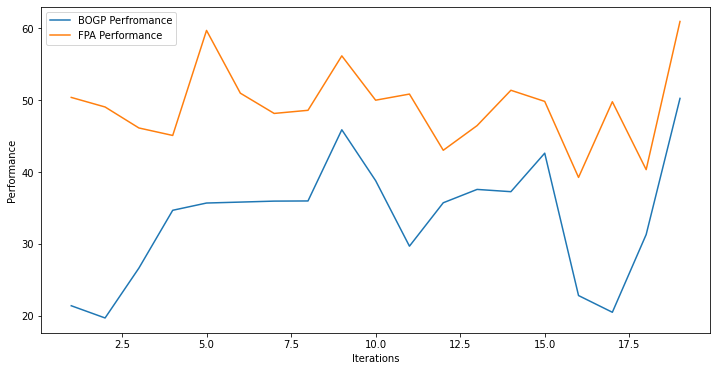

x_next is [ 40.          40.          40.          40.         -31.
  40.         -31.          40.          40.          40.
  11.71879001  -8.61666996  40.          40.         -31.
  40.         -31.          40.          40.         -31.        ]
f()=39.424566, actual=37.623
18


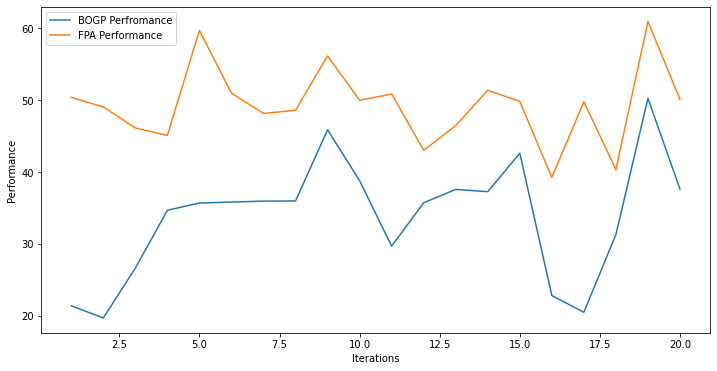

x_next is [ 37.90279549  39.6926058   39.66592084  39.97372776 -30.99468572
  39.37129699 -29.77013892  39.73826035  39.82076486  39.36568069
  39.70015576 -30.75326459  39.76357903  39.6625443  -30.55875226
  39.19258551 -30.83513475  39.90981829  39.7296498  -30.72356948]
f()=33.687020, actual=45.336
19


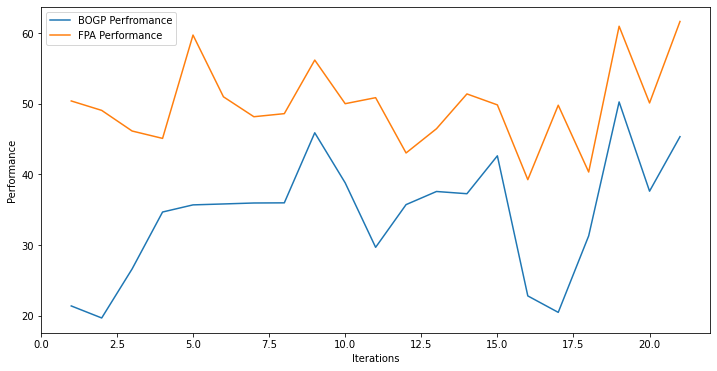

x_next is [ 38.99410843  39.63251297  36.92666835  39.97221046 -29.41803282
  35.71239938 -29.17652284  38.86948838  38.21649422  38.97488641
  37.95765004 -29.60133195  35.64948157  33.37814735 -29.20861348
  36.50937893 -27.51997874  39.444981    37.11337293 -30.19467565]
f()=34.239278, actual=40.759
20


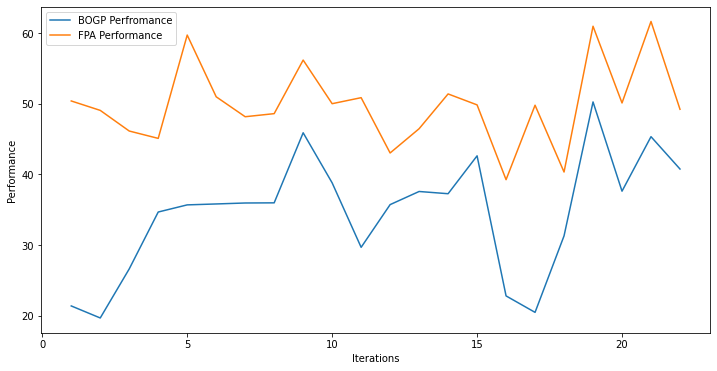

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=40.004241, actual=48.189
21


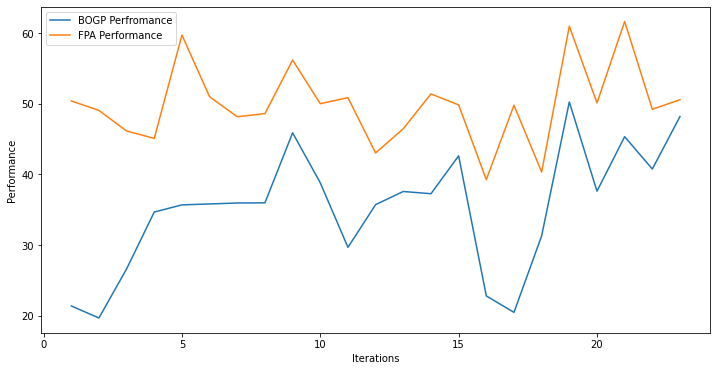

x_next is [ 40.         40.         40.         40.        -31.         40.
 -31.         40.         40.         37.0815958  40.        -31.
  40.         40.        -31.         40.        -31.         40.
  40.        -31.       ]
f()=40.665467, actual=35.280
22


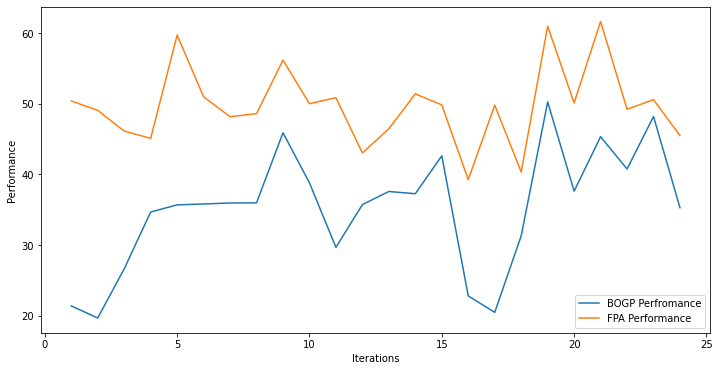

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=40.236062, actual=49.028
23


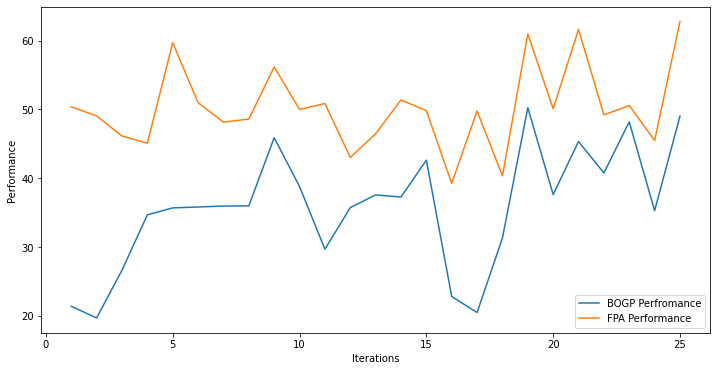

x_next is [-23.48361877  36.27557596   1.0461539    0.10643106 -28.25887172
   6.56313074 -14.21733394  -5.8789438  -15.7838156   17.05661994
  26.8082952    7.78108049 -28.91539736  11.64106629  10.74849606
  34.26614163  39.58768839  21.50611109  -4.30642562  -4.83372694]
f()=35.689403, actual=28.820
24


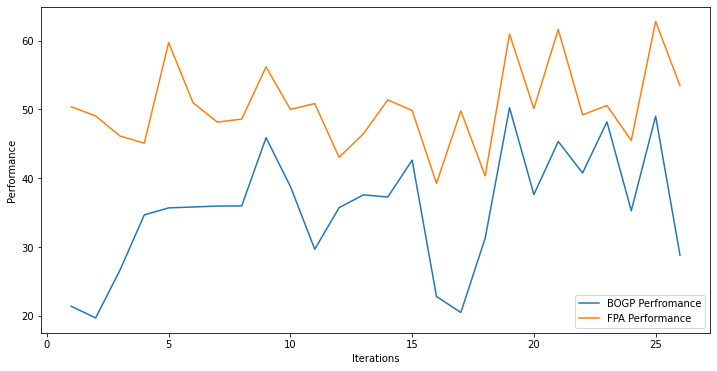

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=40.816835, actual=41.362
25


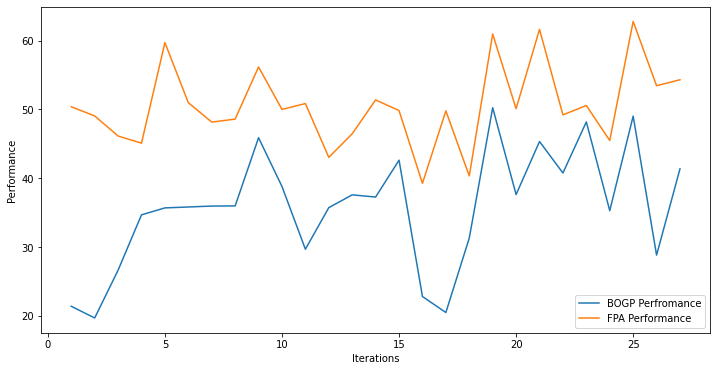

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=40.870437, actual=50.391
26


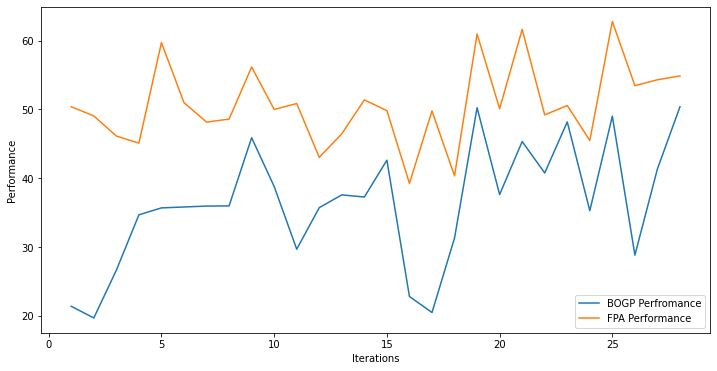

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=41.440676, actual=41.625
27


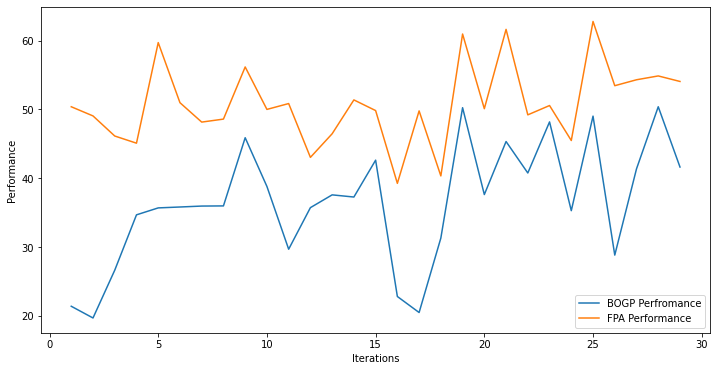

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=41.466676, actual=44.192
28


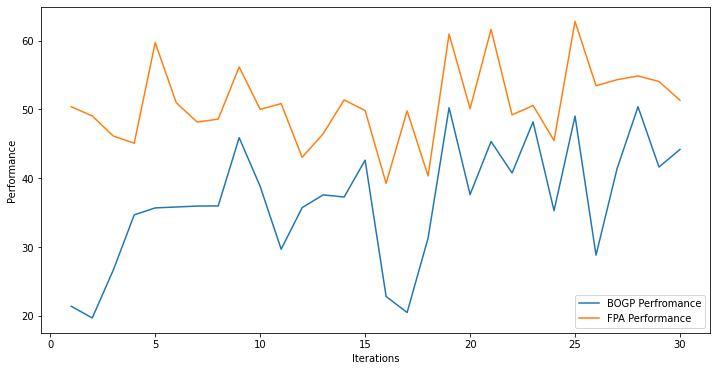

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=41.631576, actual=46.062
29


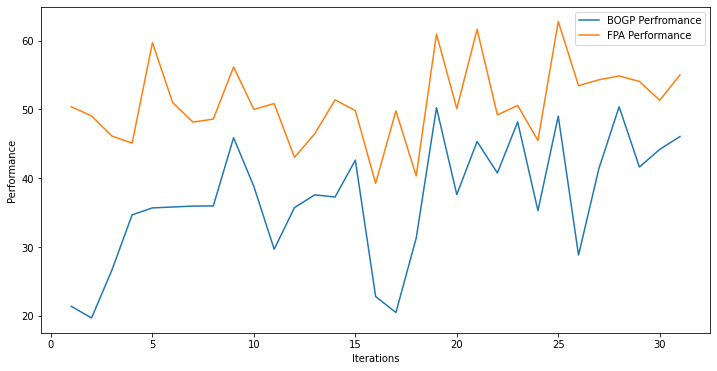

x_next is [ 40.       40.       40.       40.      -31.       40.      -31.
  40.       40.       39.90574  40.      -31.       40.       40.
 -31.       40.      -31.       40.       40.      -31.     ]
f()=41.874052, actual=39.792
30


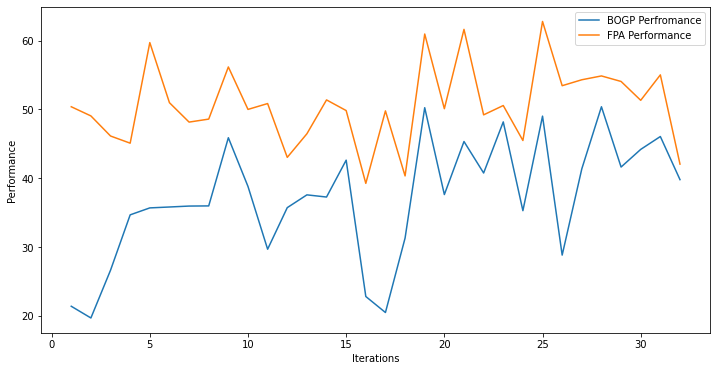

x_next is [ 40.          40.          40.          40.         -31.
  40.         -31.          40.          40.          39.39345986
  40.         -31.          40.          40.         -31.
  40.         -31.          40.          40.         -31.        ]
f()=41.776349, actual=40.354
31


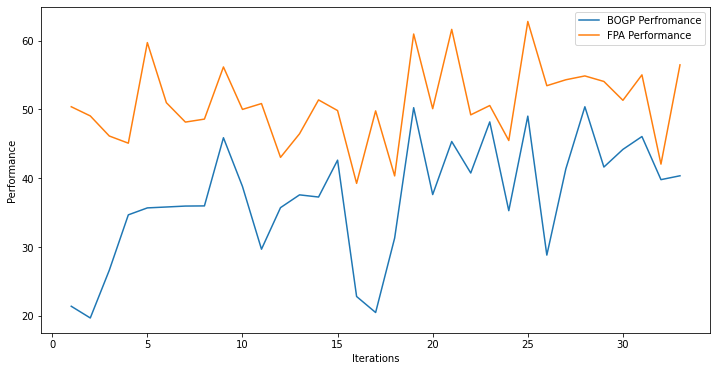

x_next is [ 40.          40.          40.          40.         -31.
  40.         -31.          40.          40.          38.67174172
  40.         -31.          40.          40.         -31.
  40.         -31.          40.          40.         -31.        ]
f()=41.716095, actual=50.455
32


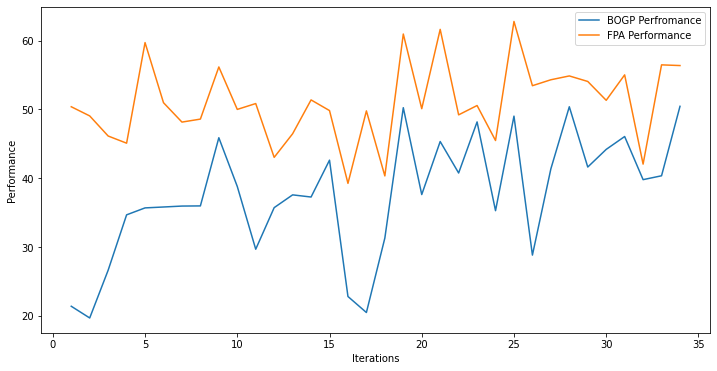

x_next is [ 40.          40.          40.          40.         -31.
  40.         -31.          40.          40.          31.65719103
  40.         -31.          40.          40.         -31.
  40.         -31.          40.          40.         -31.        ]
f()=42.105868, actual=37.381
33


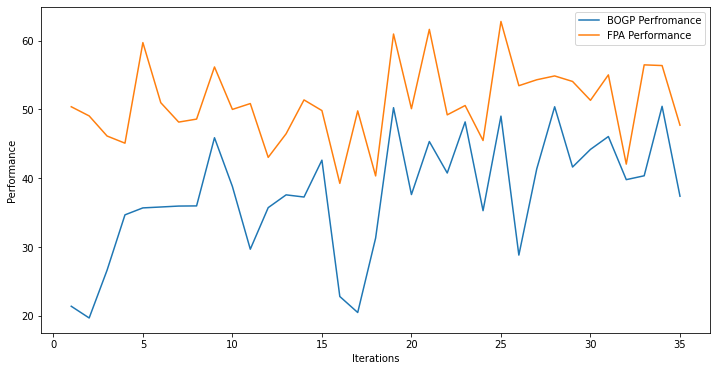

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=41.893371, actual=37.595
34


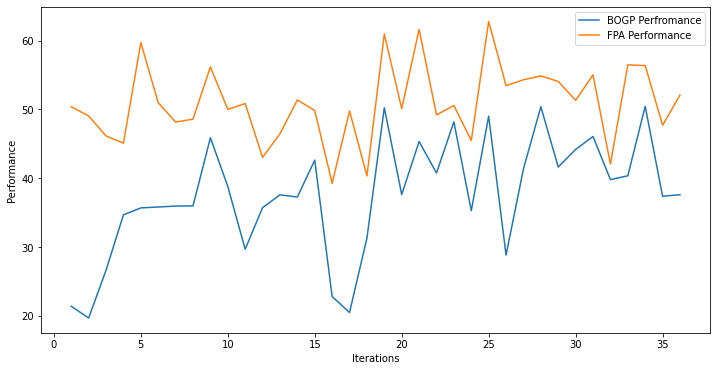

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=41.712730, actual=39.957
35


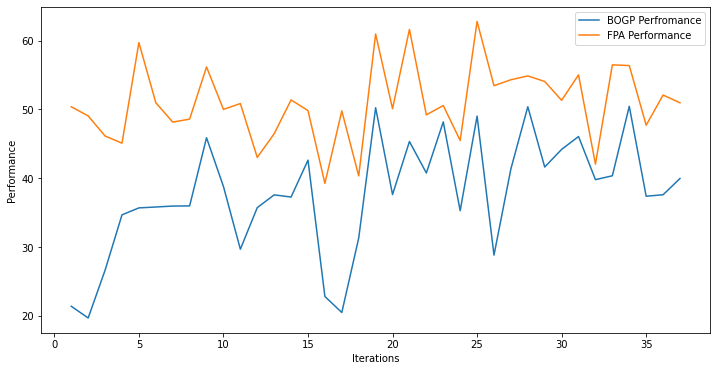

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=41.647609, actual=44.720
36


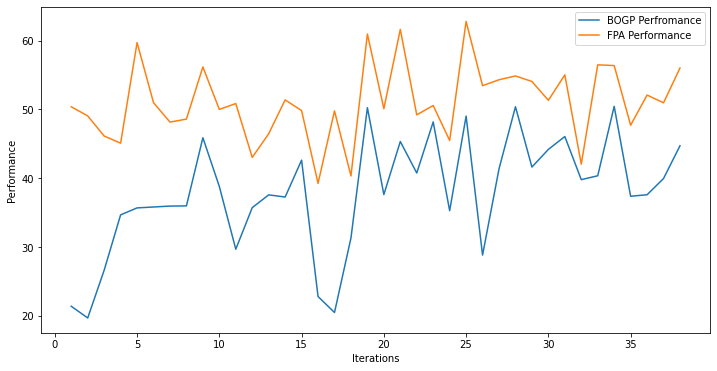

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=41.772126, actual=47.830
37


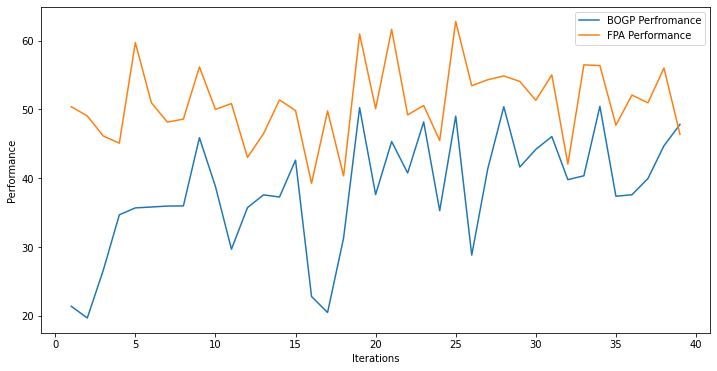

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=41.997477, actual=45.566
38


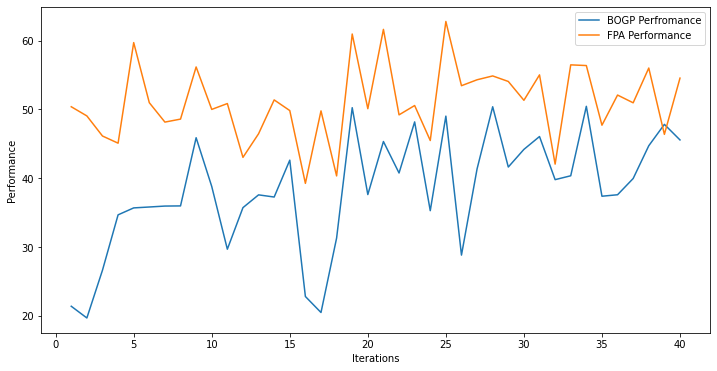

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.130445, actual=46.770
39


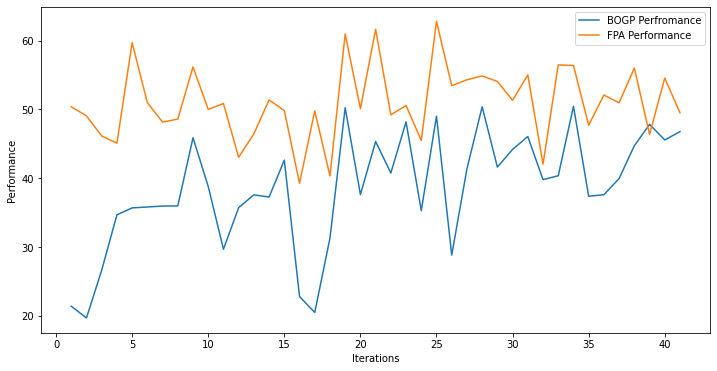

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.294363, actual=42.609
40


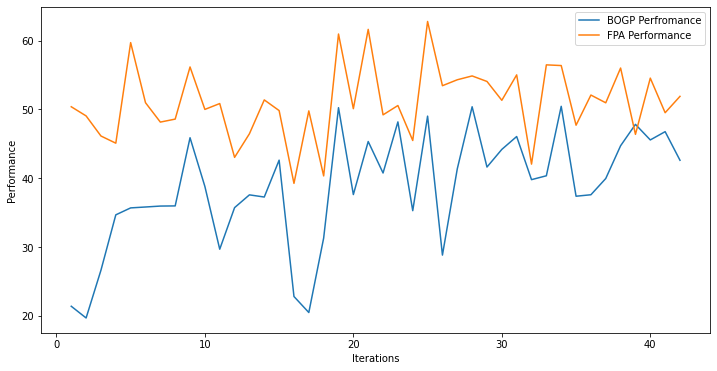

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.310571, actual=43.051
41


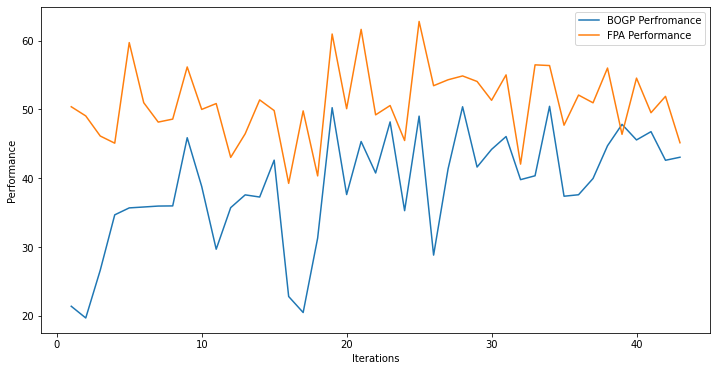

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.340001, actual=41.967
42


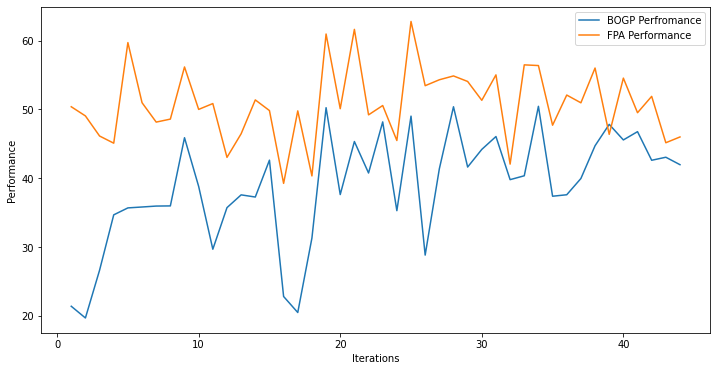

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.332899, actual=41.439
43


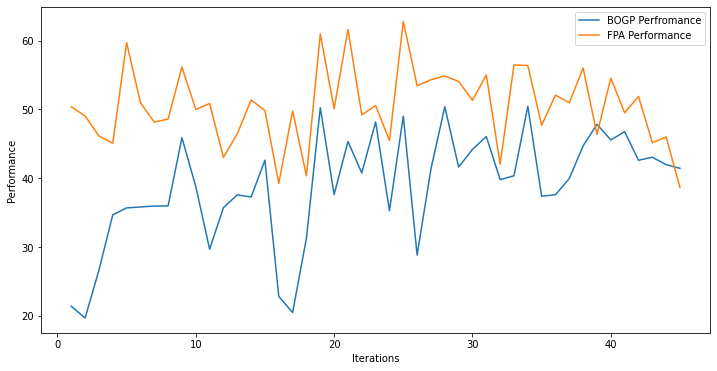

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.309577, actual=37.797
44


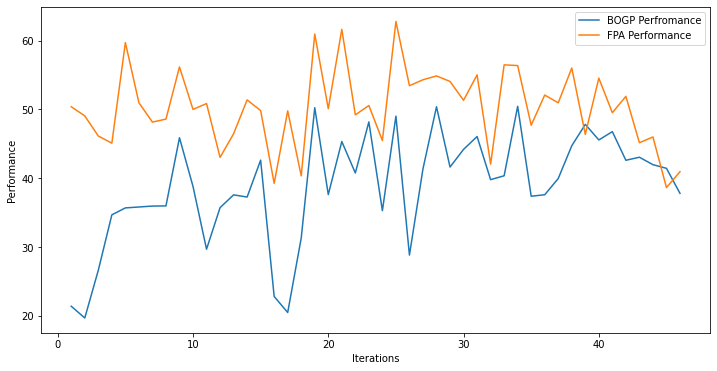

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.174325, actual=53.264
45


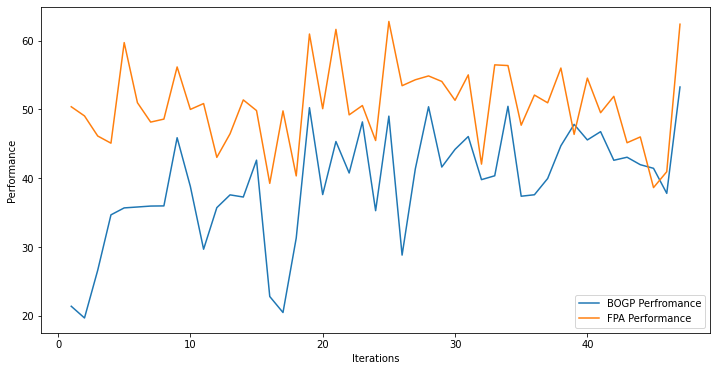

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.478697, actual=40.724
46


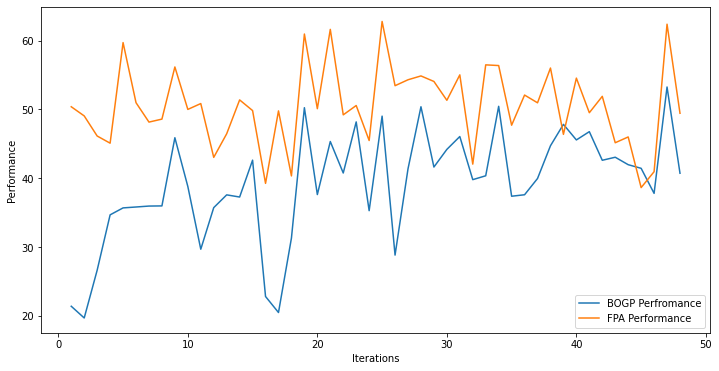

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.432516, actual=49.227
47


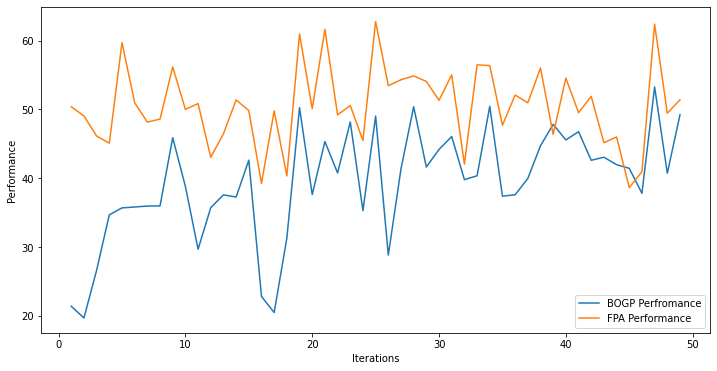

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.615788, actual=45.664
48


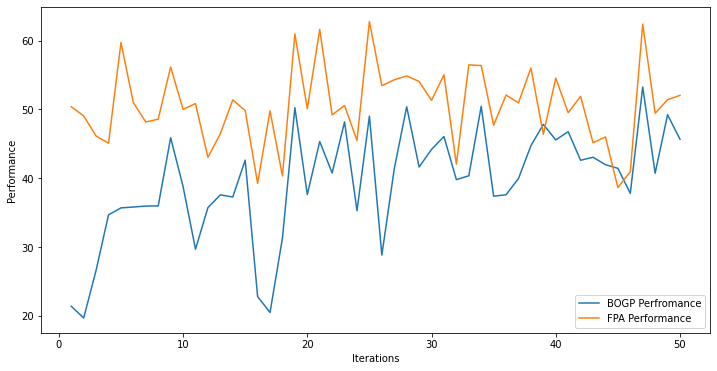

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.699792, actual=49.200
49


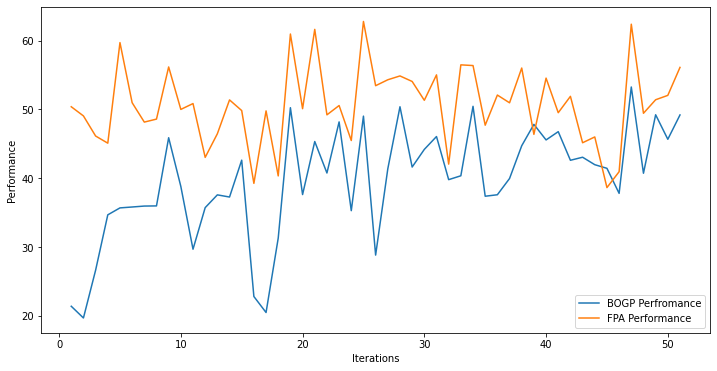

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.866762, actual=46.701
50


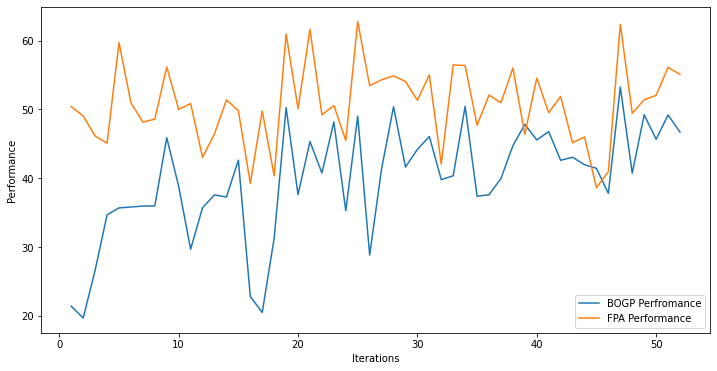

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.965812, actual=45.787
51


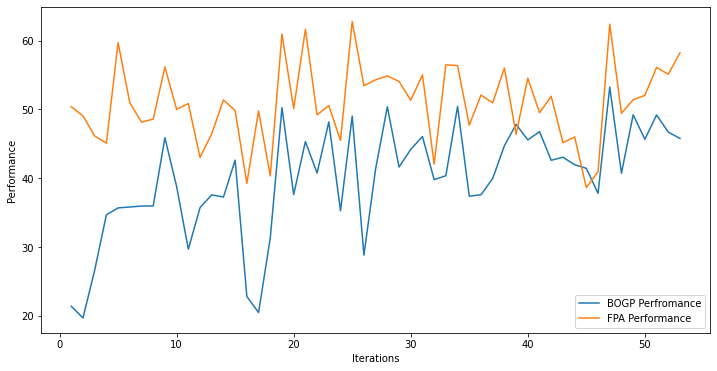

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=43.038199, actual=49.387
52


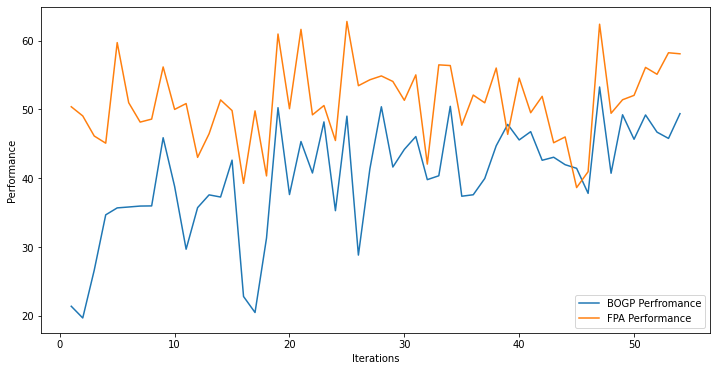

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=43.189997, actual=45.667
53


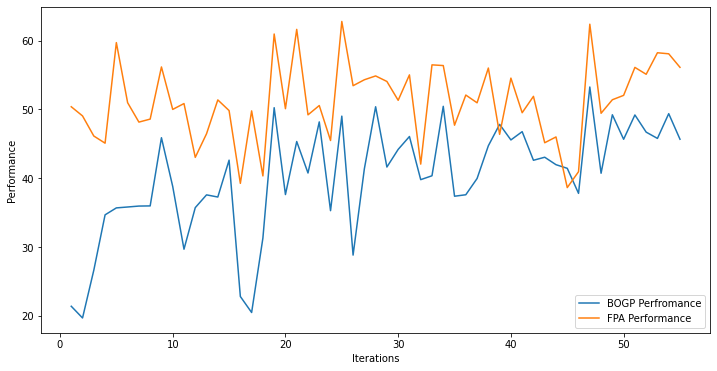

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=43.251128, actual=38.843
54


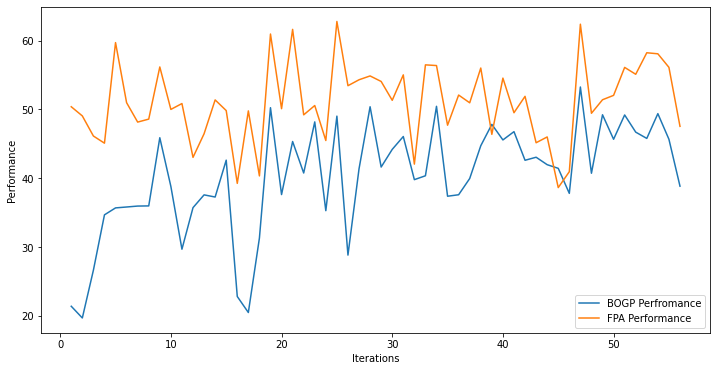

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=43.149364, actual=44.463
55


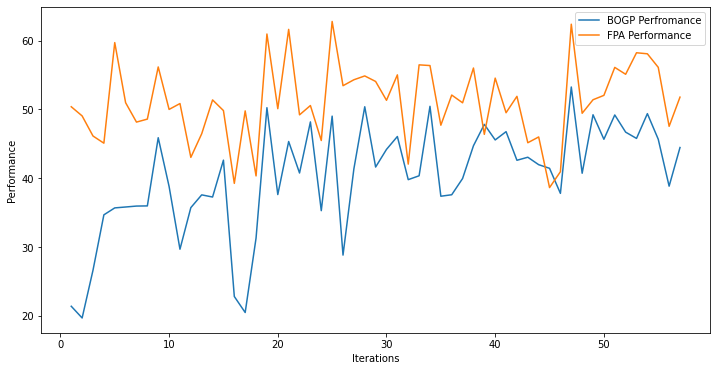

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=43.181786, actual=40.629
56


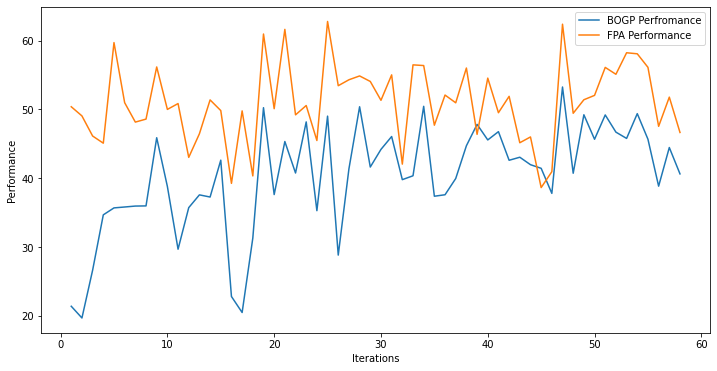

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=43.127126, actual=39.461
57


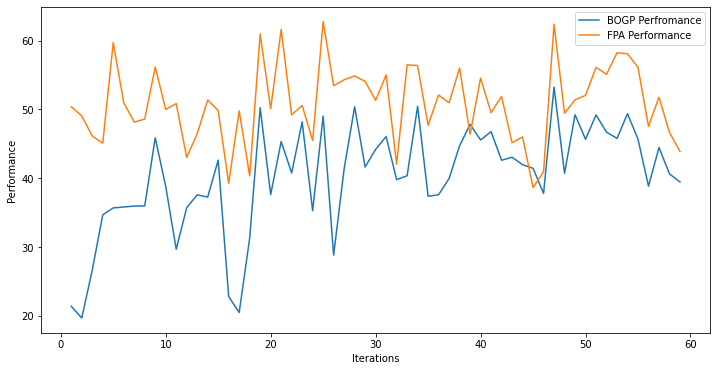

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=43.048671, actual=38.892
58


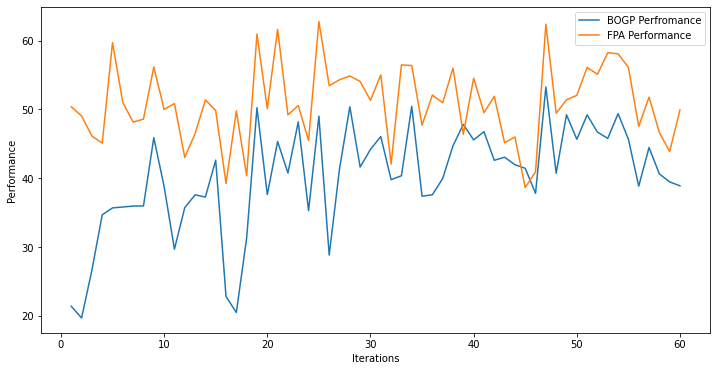

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.961070, actual=43.350
59


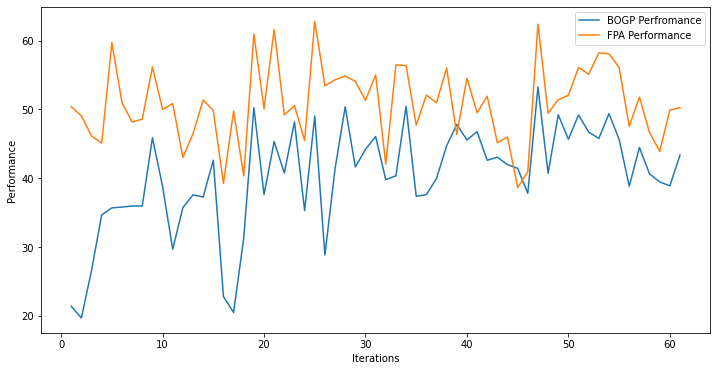

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.971465, actual=45.905
60


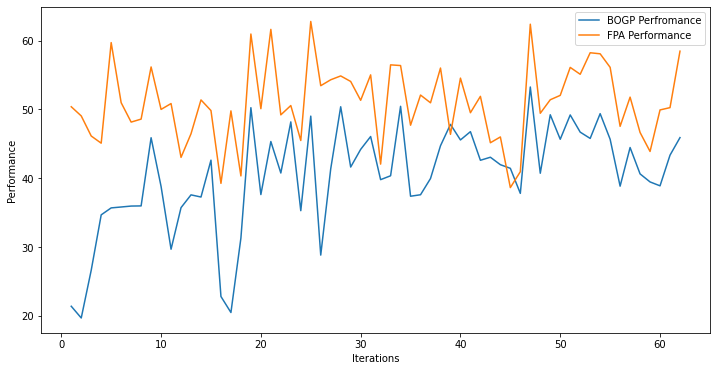

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=43.032480, actual=47.961
61


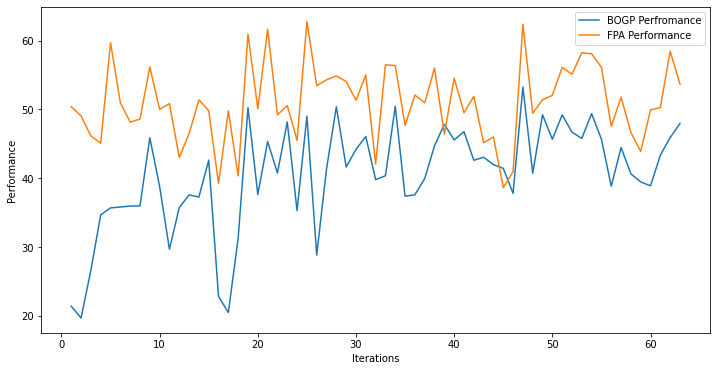

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=43.130477, actual=33.559
62


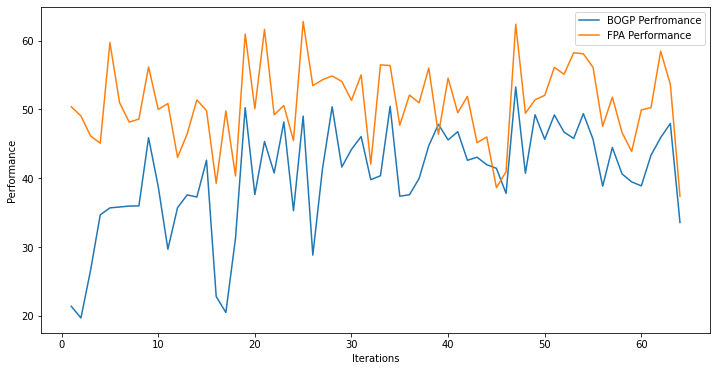

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.936663, actual=42.966
63


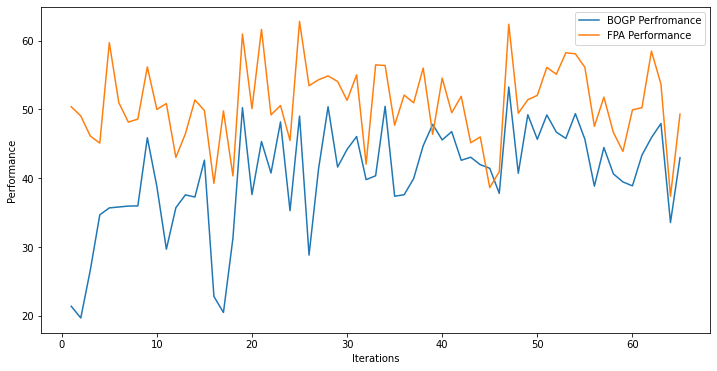

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.939249, actual=46.033
64


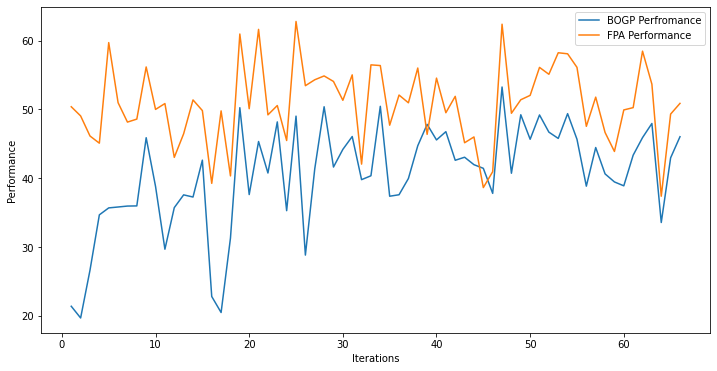

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.998521, actual=23.747
65


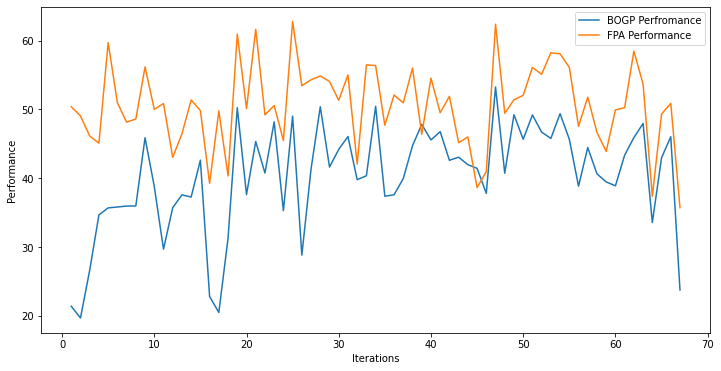

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.616787, actual=42.427
66


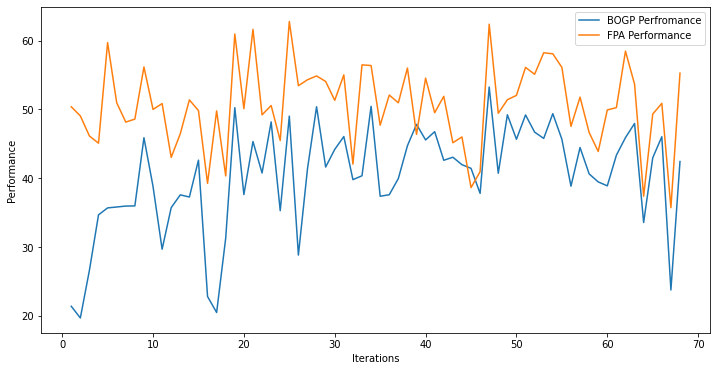

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.615286, actual=37.465
67


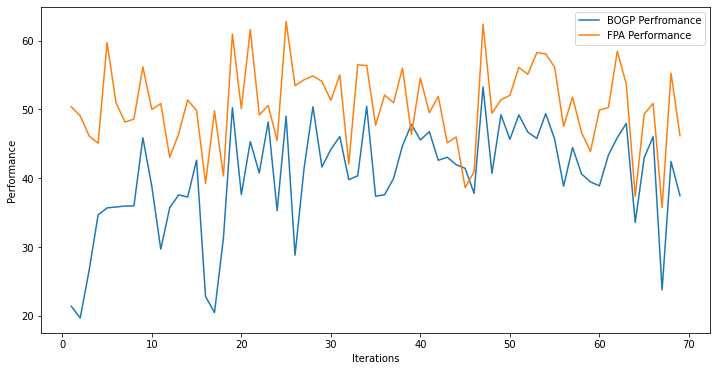

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.524058, actual=47.443
68


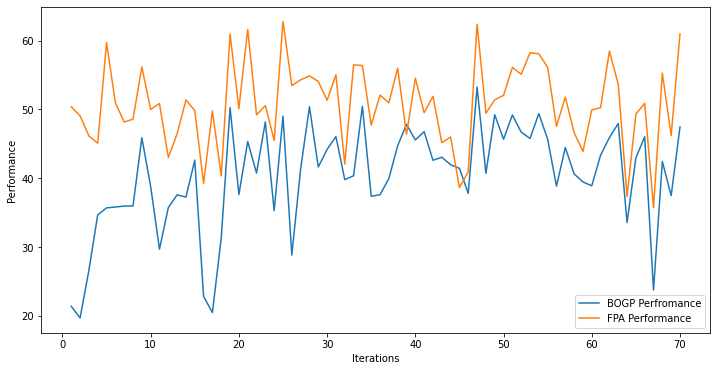

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.609899, actual=40.571
69


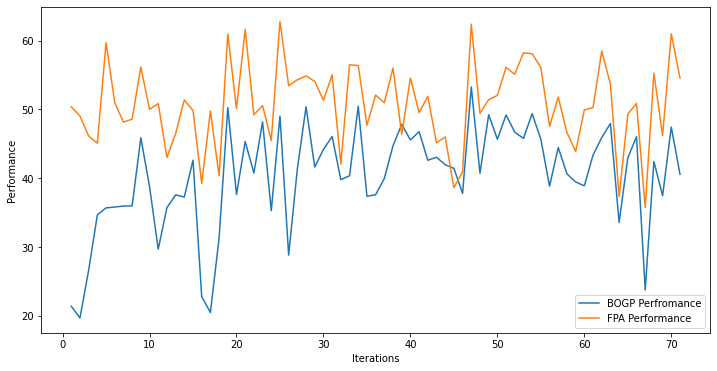

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.576464, actual=31.230
70


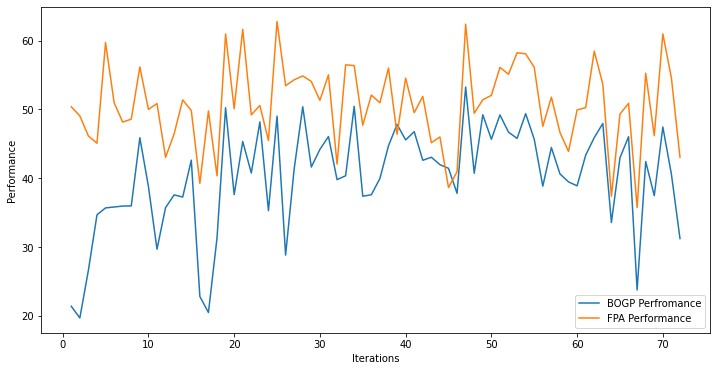

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.379469, actual=40.074
71


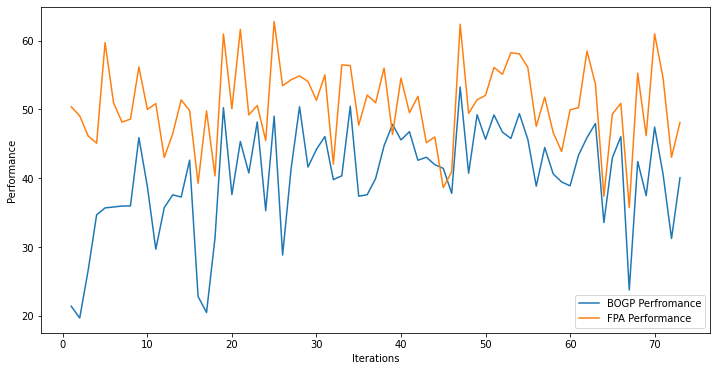

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.342688, actual=49.461
72


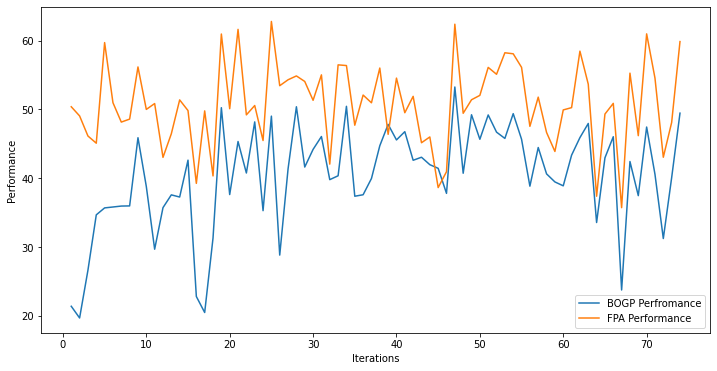

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.457170, actual=45.953
73


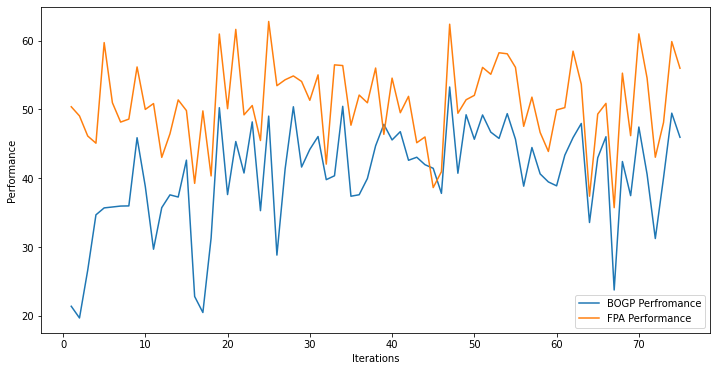

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.513992, actual=48.717
74


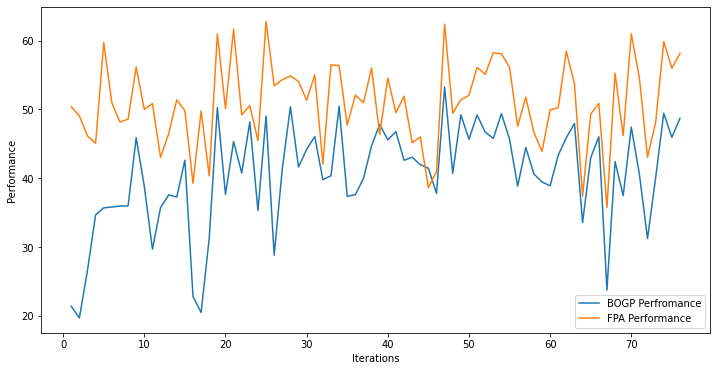

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.611177, actual=51.509
75


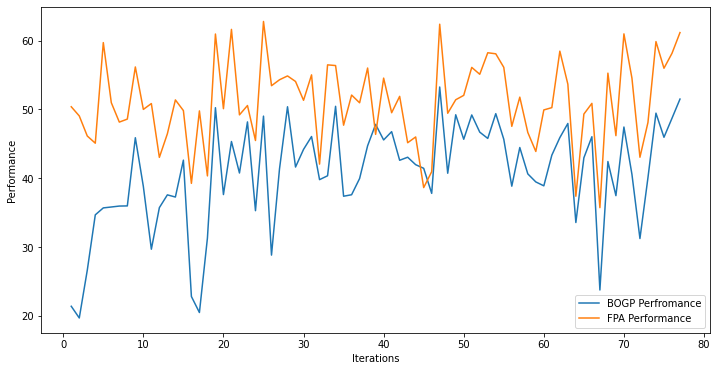

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.746603, actual=42.979
76


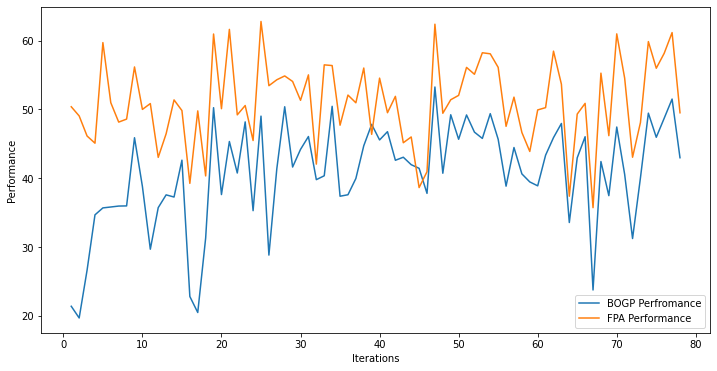

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.751617, actual=39.826
77


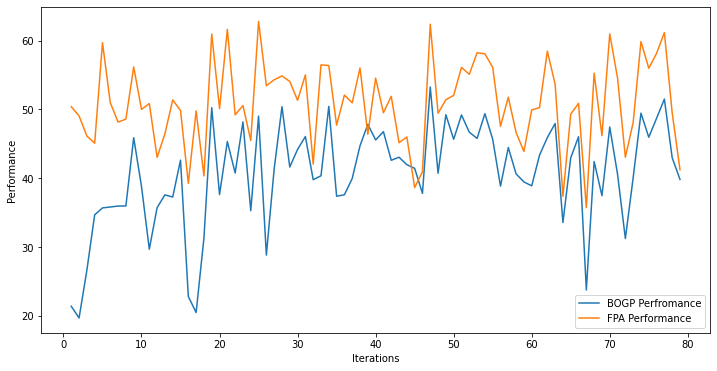

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.708546, actual=43.833
78


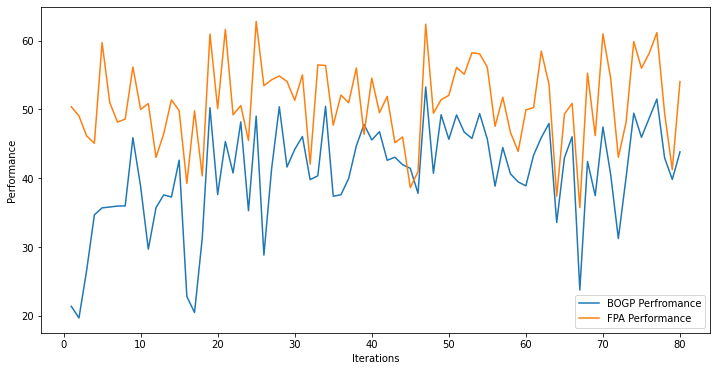

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.726526, actual=38.875
79


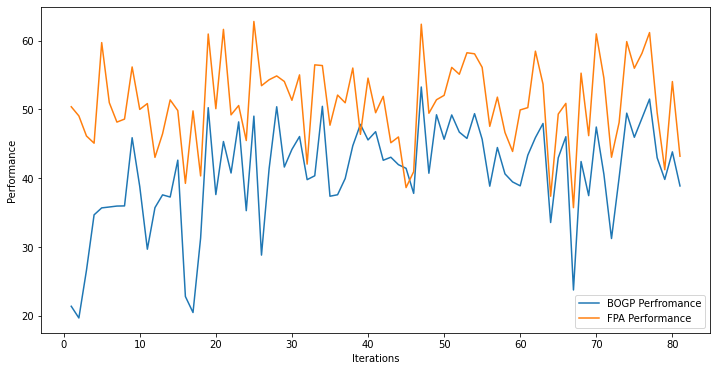

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.670838, actual=39.015
80


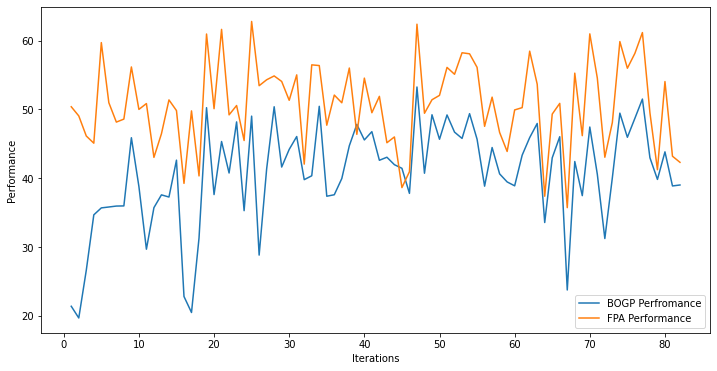

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.618824, actual=35.689
81


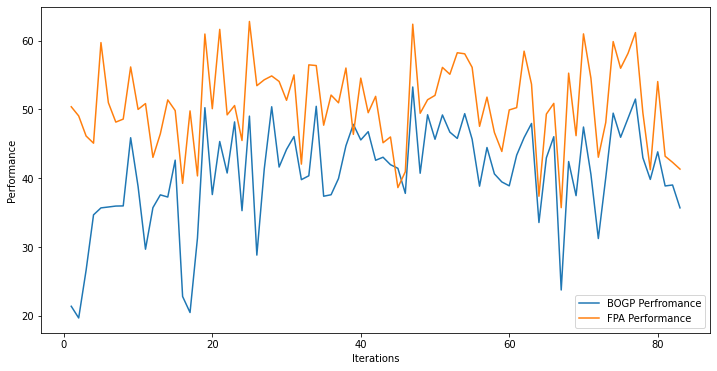

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.519542, actual=47.013
82


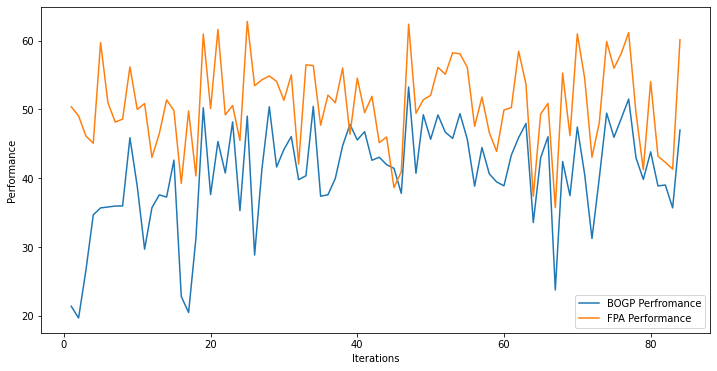

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.582754, actual=47.024
83


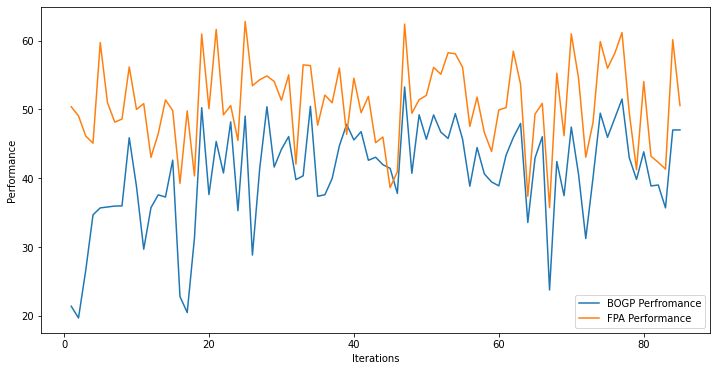

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.644395, actual=41.373
84


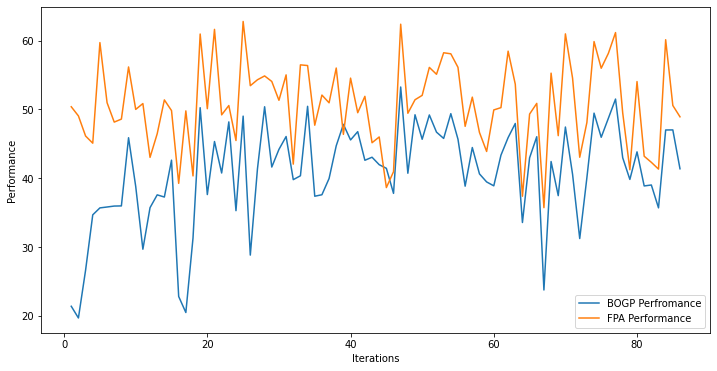

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.628142, actual=38.051
85


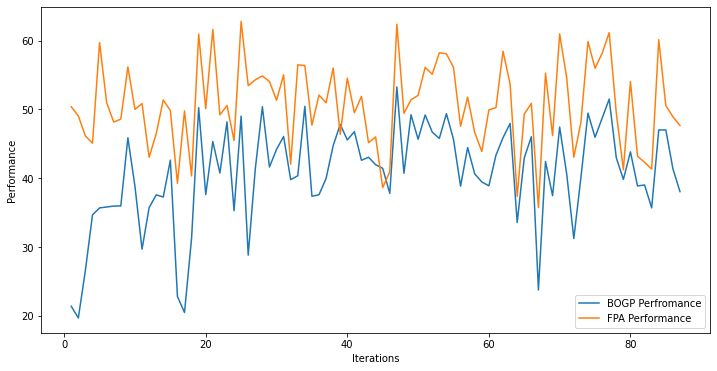

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.566902, actual=43.092
86


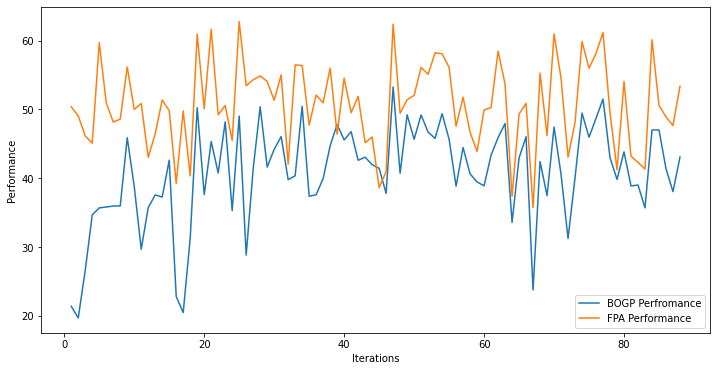

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.574915, actual=49.680
87


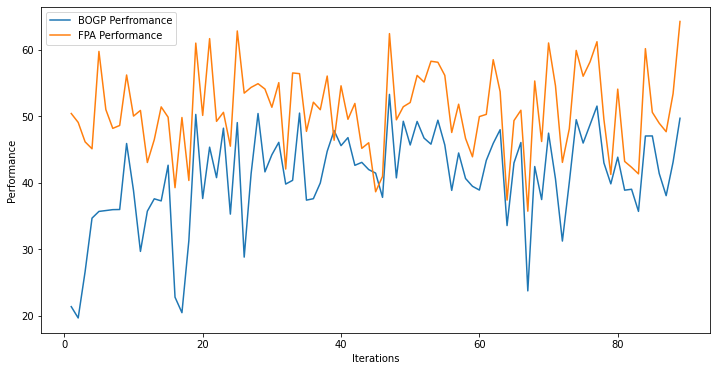

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.666959, actual=41.791
88


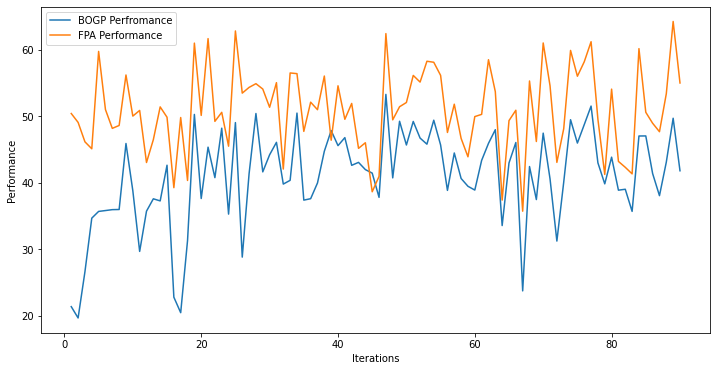

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.656634, actual=41.327
89


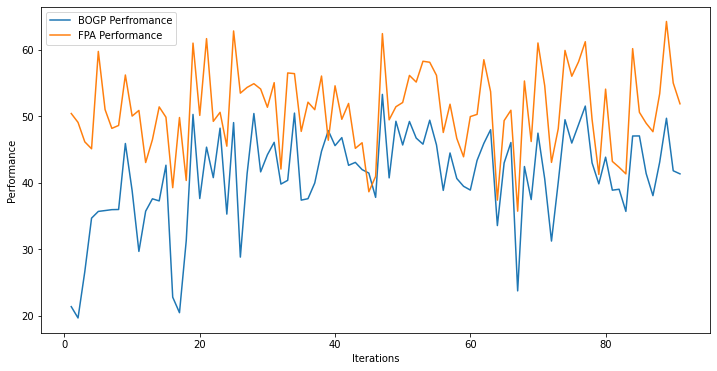

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.640594, actual=41.641
90


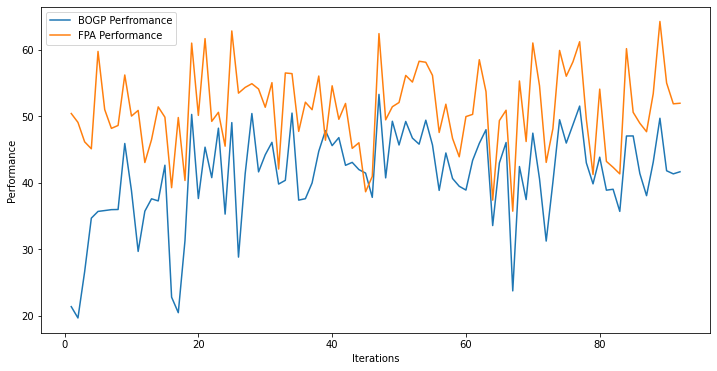

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.628928, actual=28.309
91


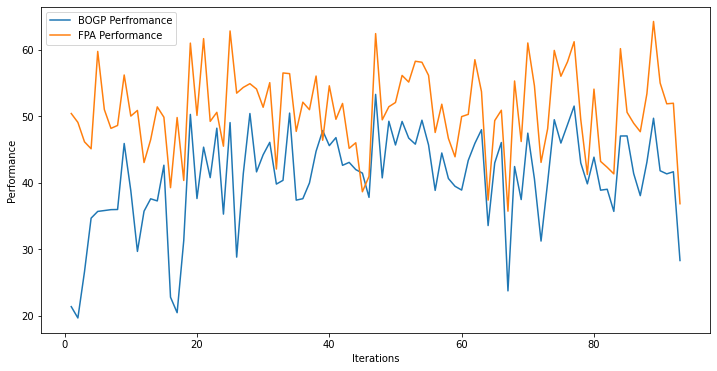

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.444746, actual=42.460
92


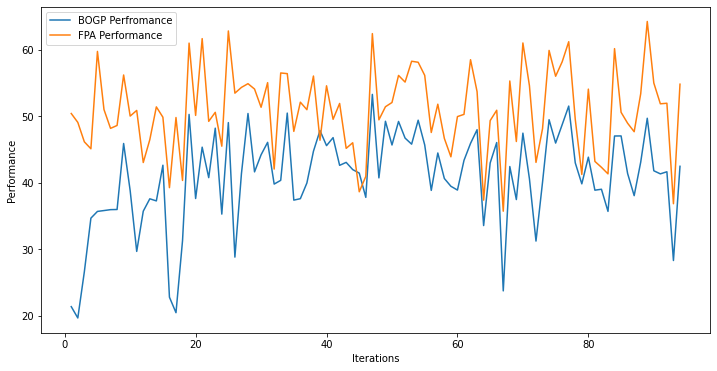

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.445866, actual=47.313
93


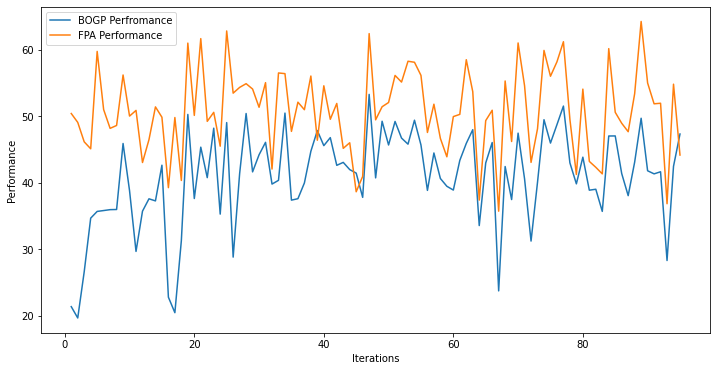

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.505002, actual=49.883
94


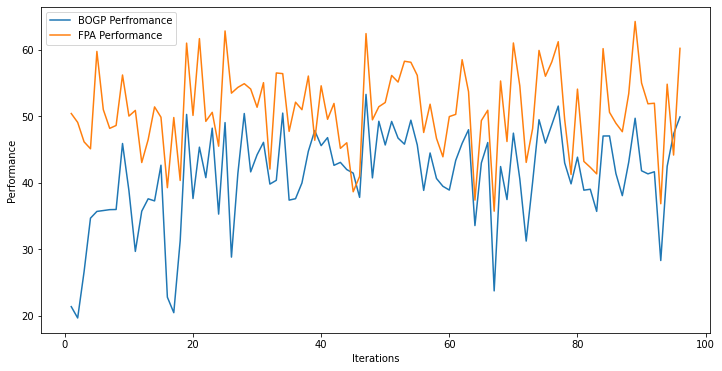

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.592551, actual=42.355
95


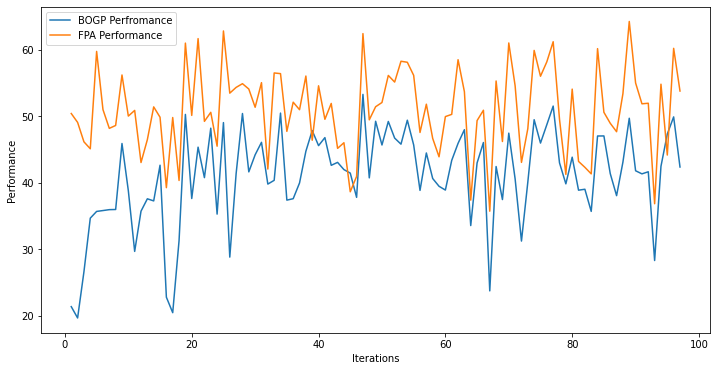

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.590608, actual=41.561
96


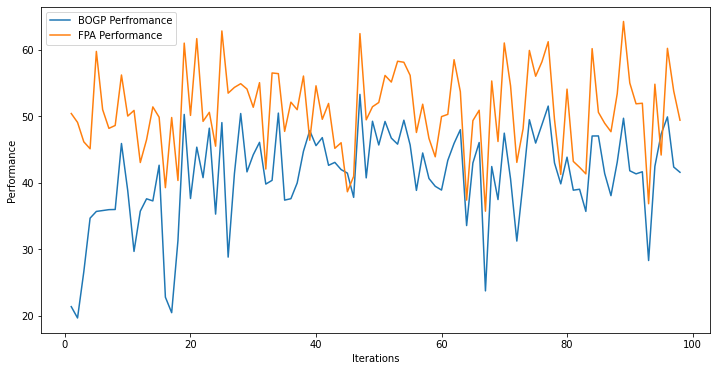

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.579376, actual=47.952
97


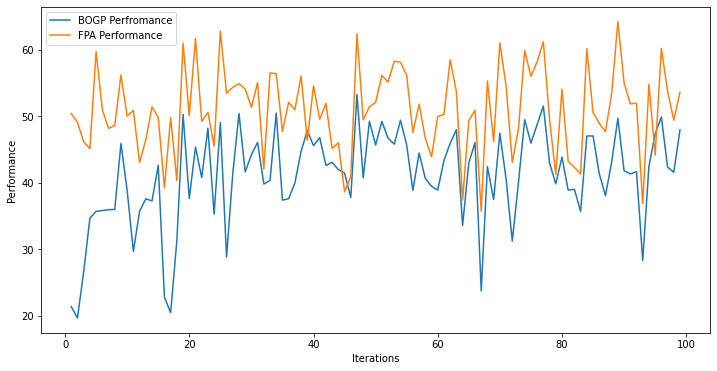

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.641489, actual=39.980
98


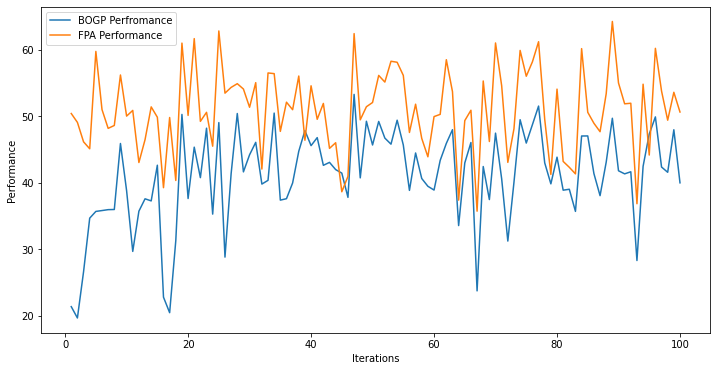

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.611657, actual=40.201
99


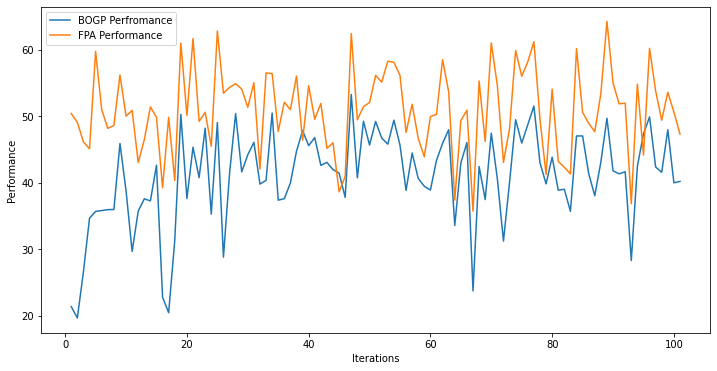

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.585020, actual=43.469
100


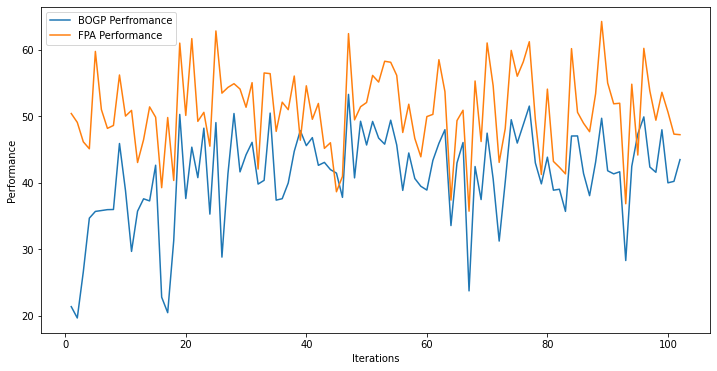

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.595647, actual=38.780
101


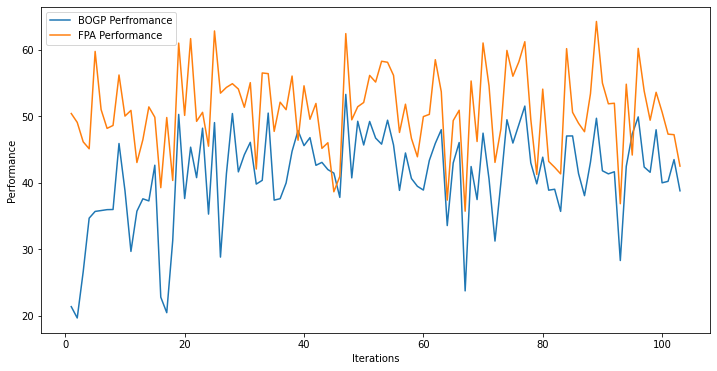

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.553794, actual=36.564
102


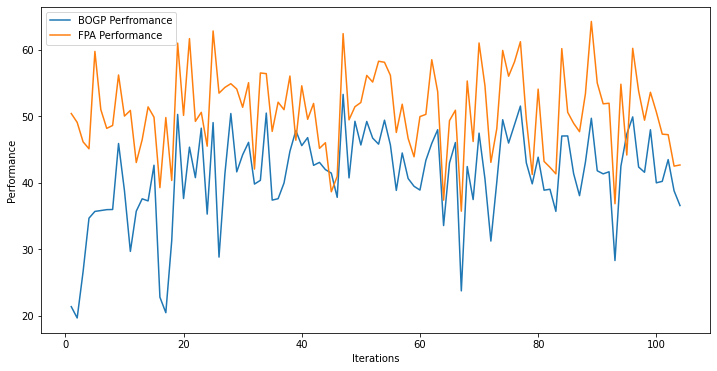

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.488048, actual=36.375
103


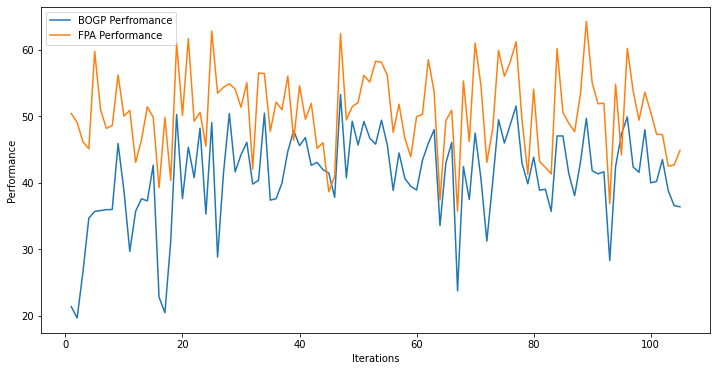

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.421665, actual=38.255
104


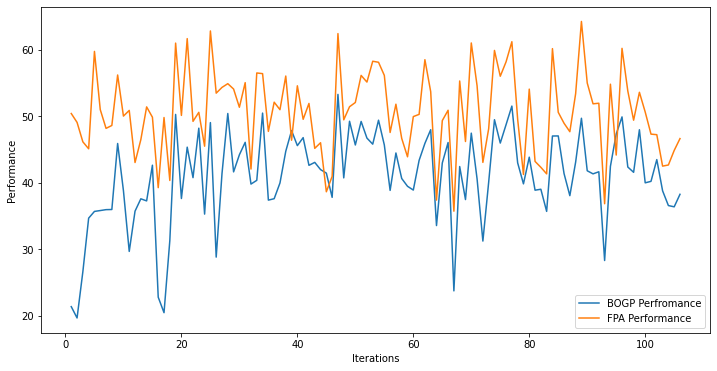

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.377334, actual=43.828
105


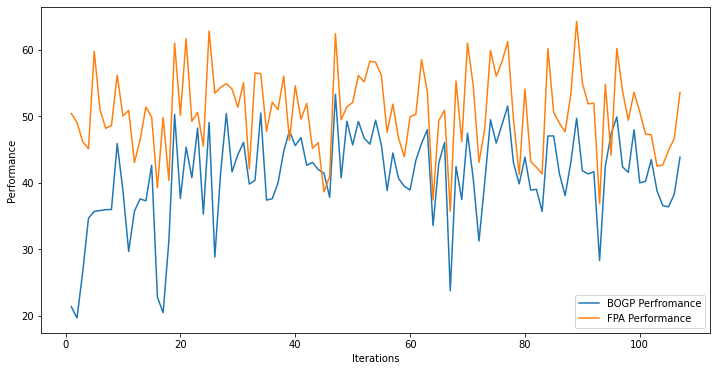

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.393311, actual=42.190
106


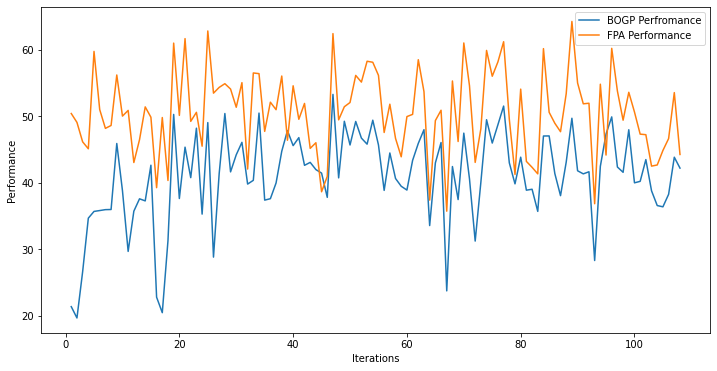

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.391842, actual=35.325
107


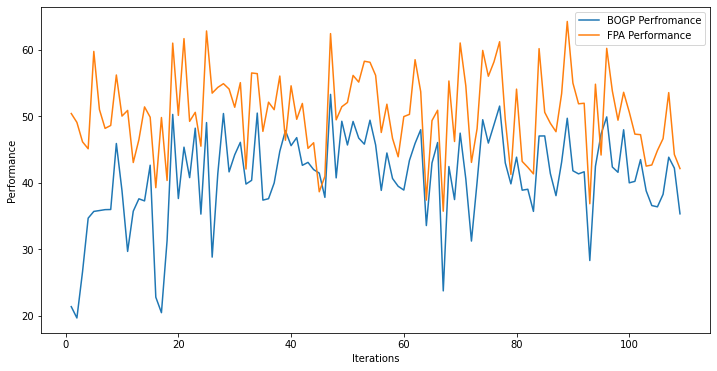

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.318017, actual=45.392
108


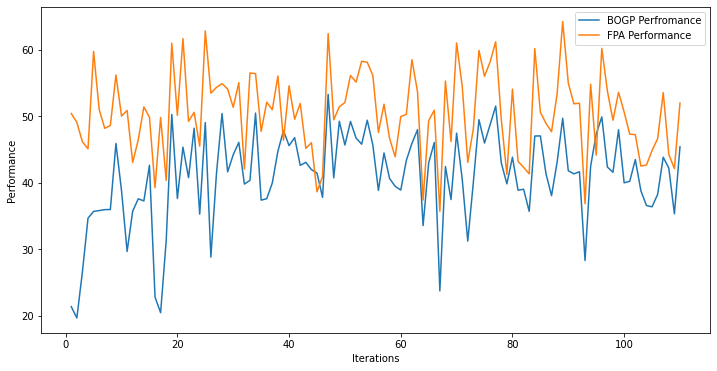

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.349951, actual=44.172
109


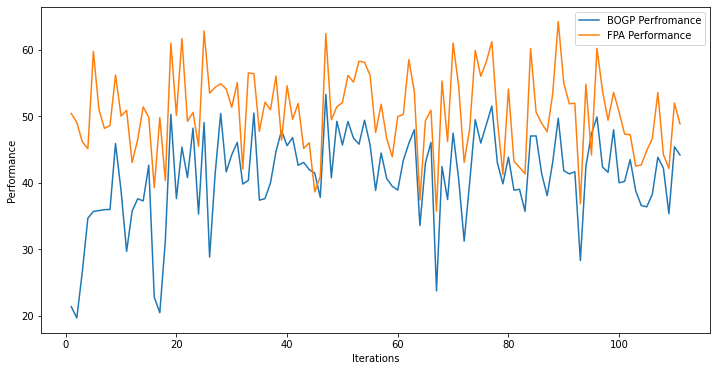

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.368991, actual=42.109
110


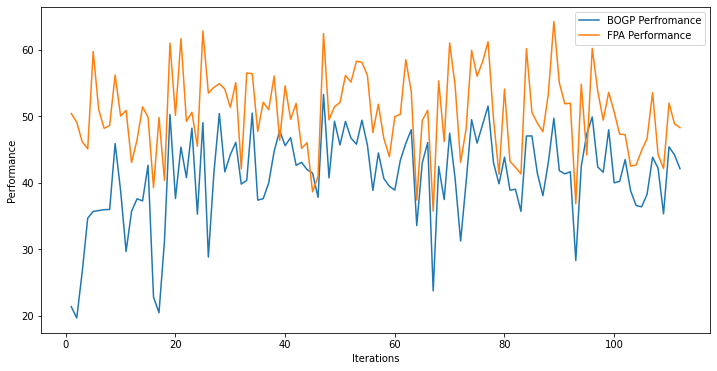

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.366979, actual=42.051
111


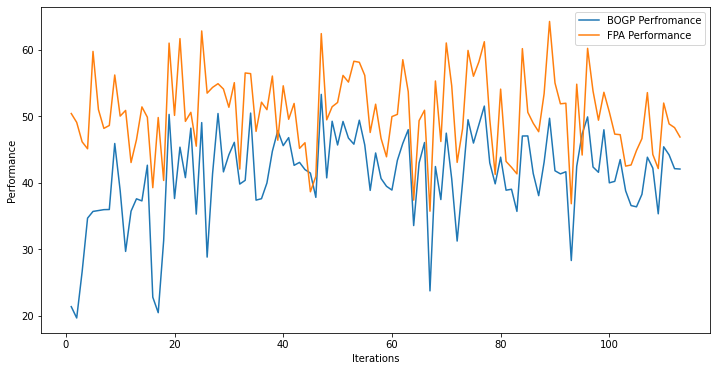

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.364416, actual=43.626
112


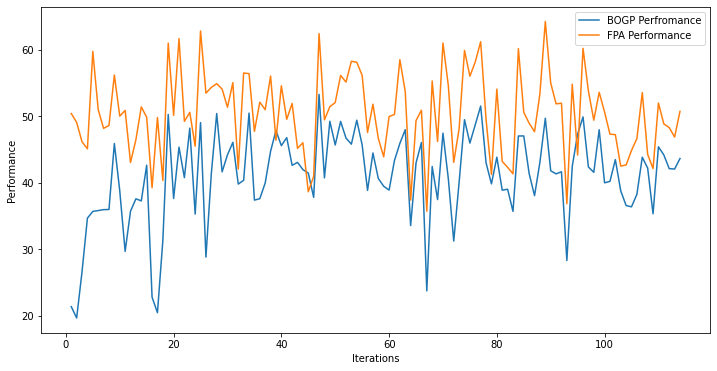

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.377392, actual=38.471
113


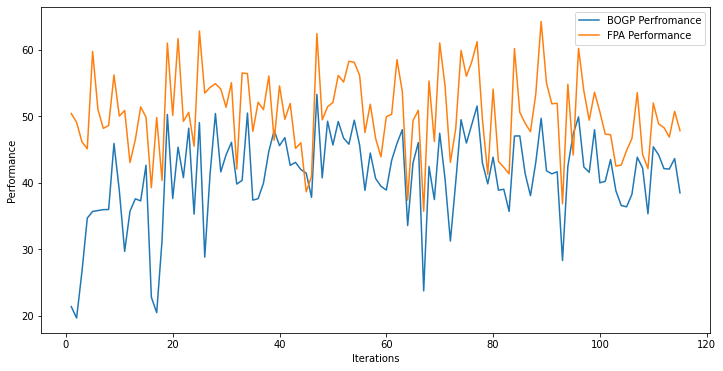

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.339495, actual=38.608
114


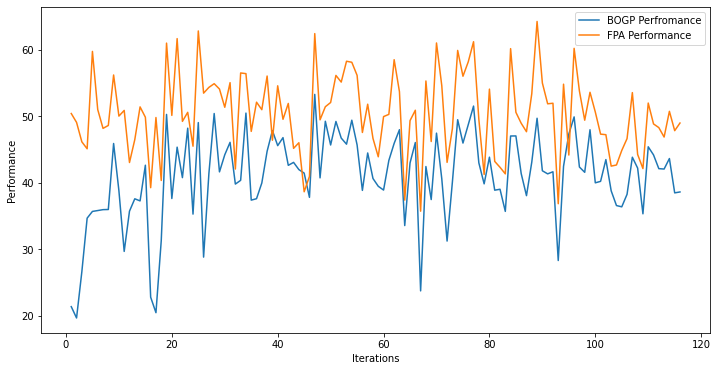

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.303682, actual=39.665
115


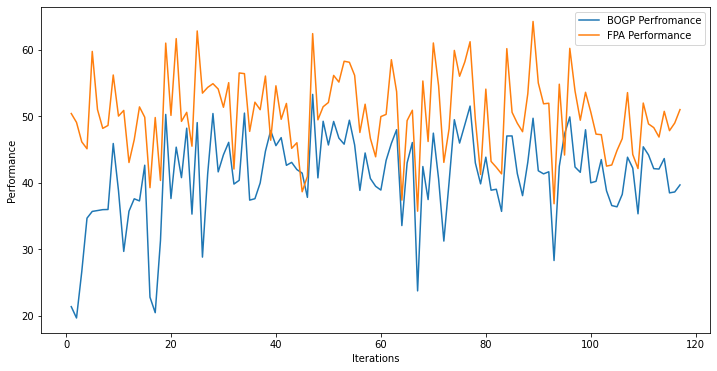

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.278808, actual=40.360
116


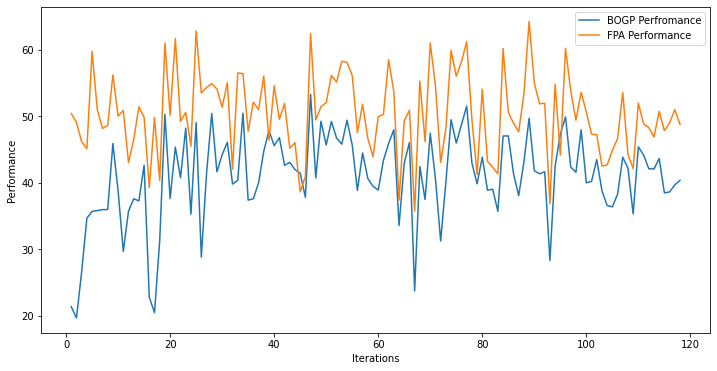

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.261061, actual=41.770
117


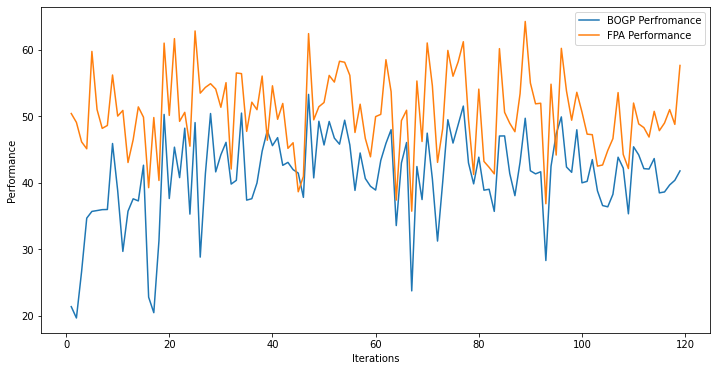

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.256958, actual=40.905
118


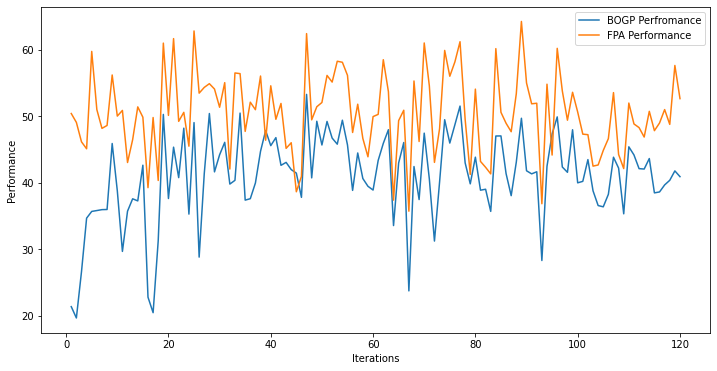

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.244845, actual=44.387
119


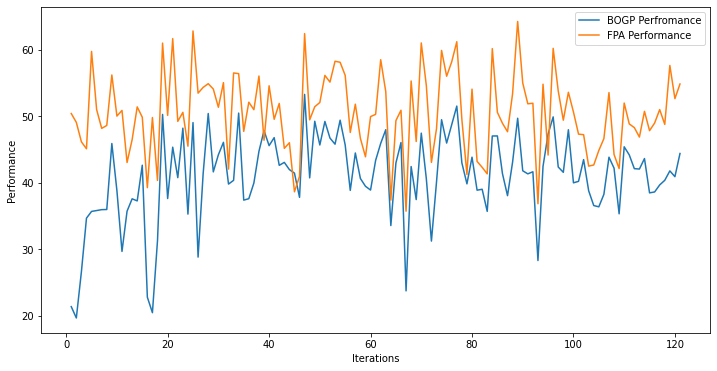

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.264991, actual=46.225
120


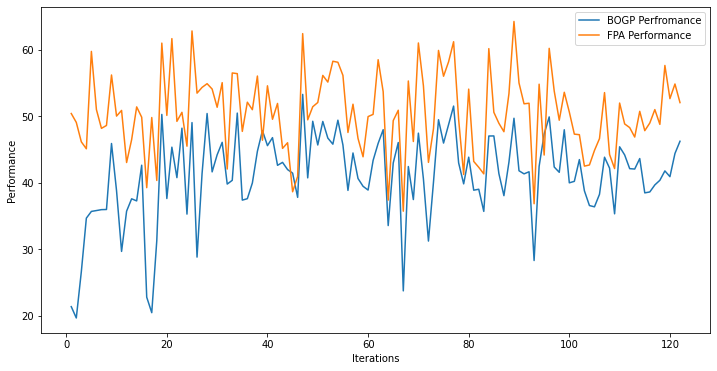

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.301334, actual=34.979
121


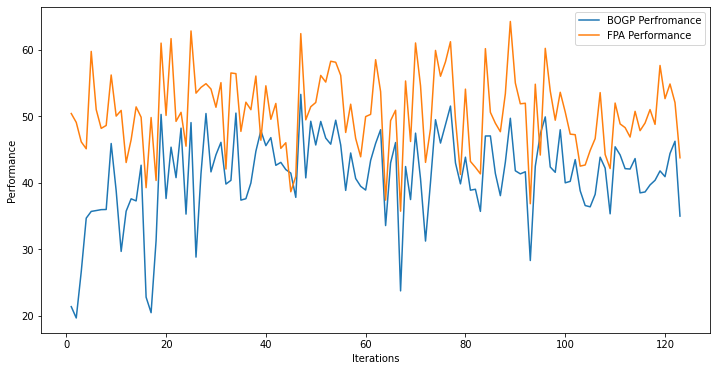

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.234481, actual=36.711
122


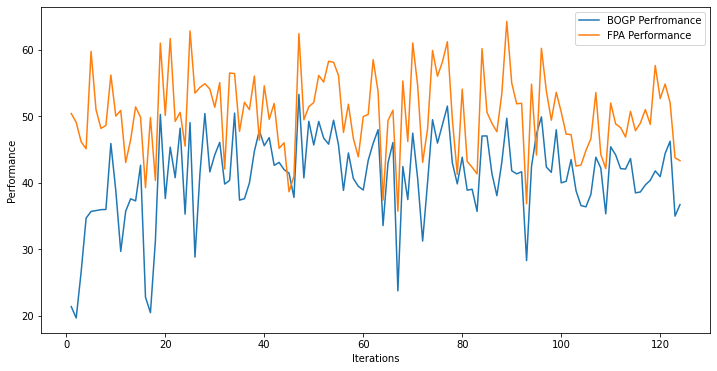

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.184819, actual=40.240
123


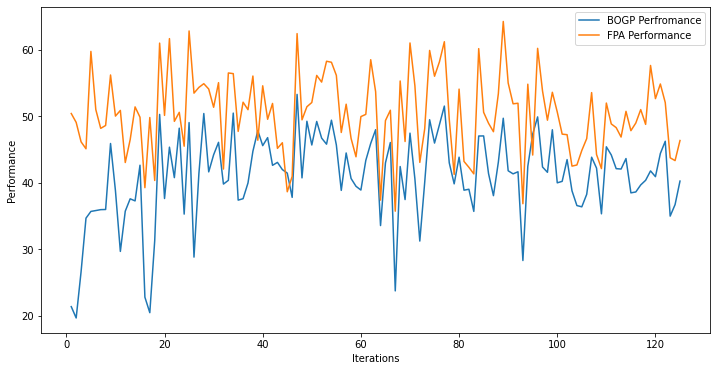

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.167917, actual=31.385
124


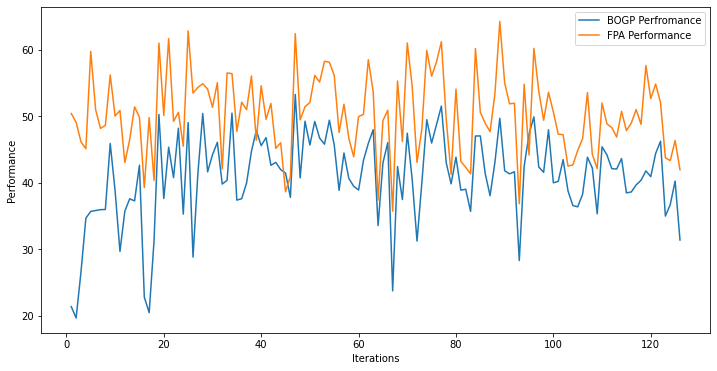

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.071274, actual=39.444
125


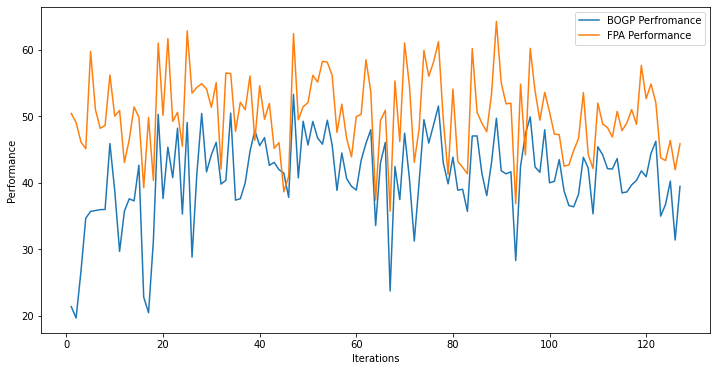

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.048652, actual=40.504
126


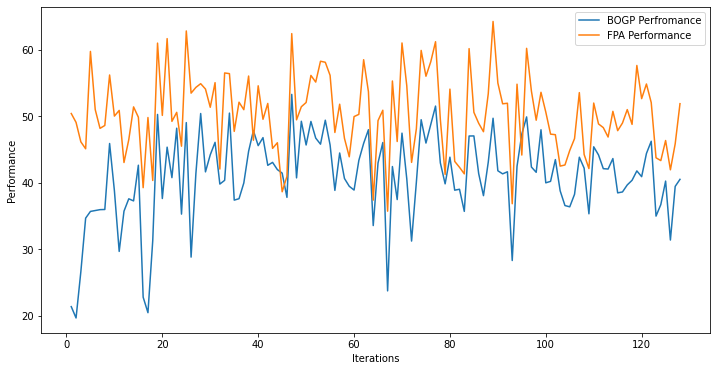

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.035672, actual=41.363
127


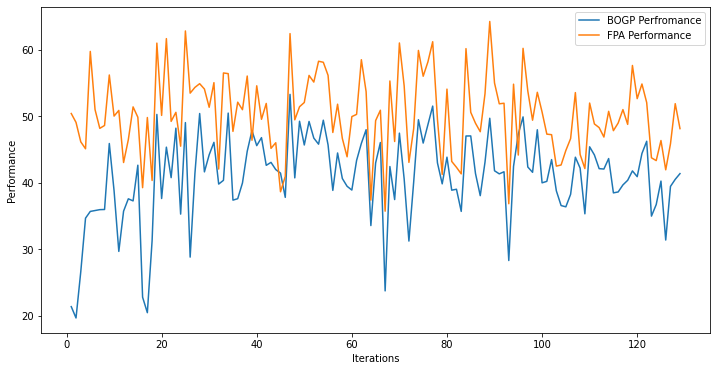

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.030312, actual=36.334
128


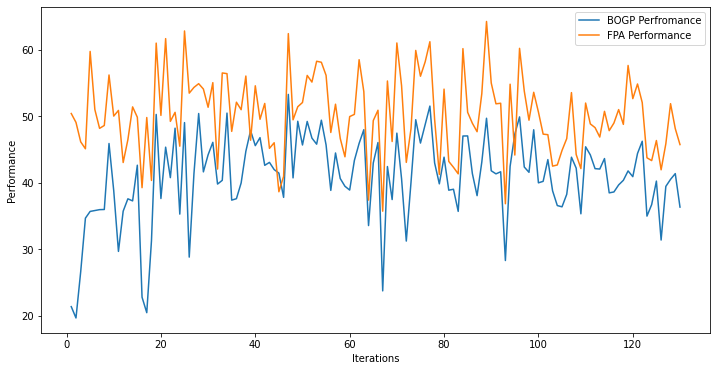

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=41.981716, actual=43.347
129


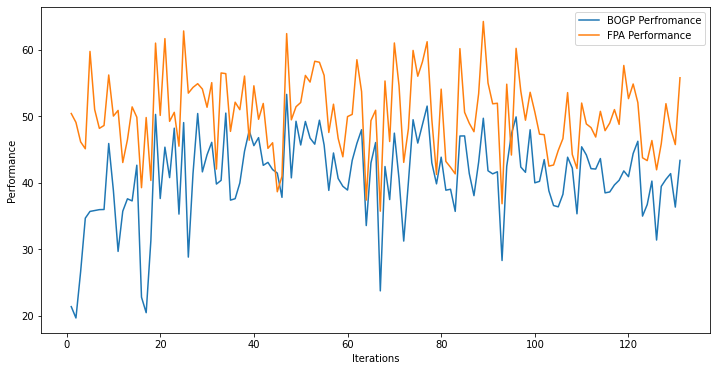

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=41.993605, actual=47.698
130


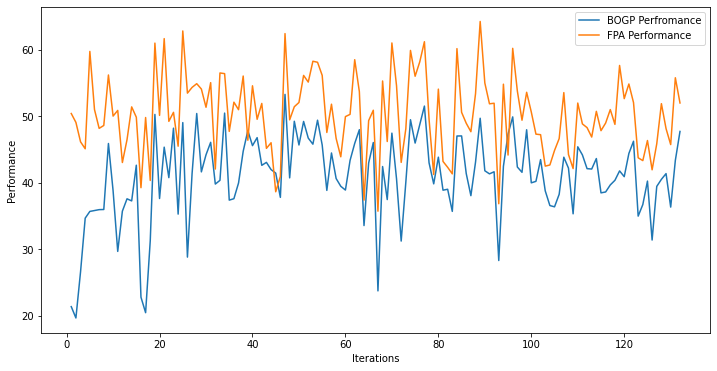

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.041192, actual=46.474
131


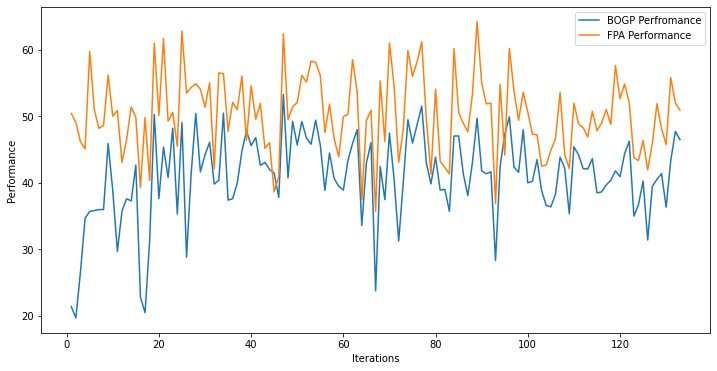

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.078046, actual=53.508
132


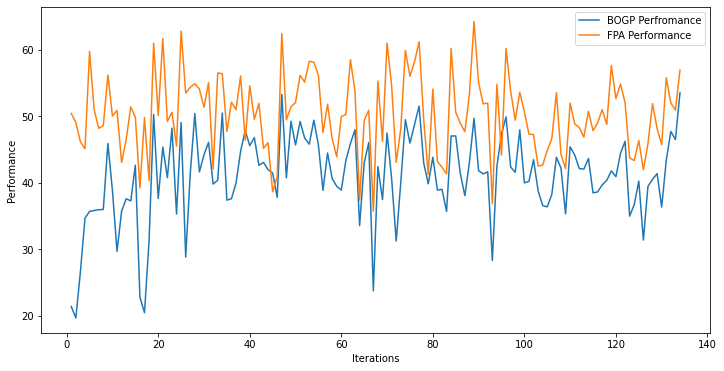

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.170436, actual=36.543
133


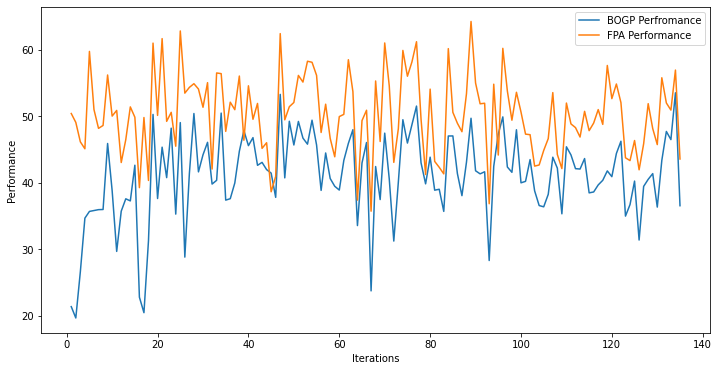

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.124409, actual=33.265
134


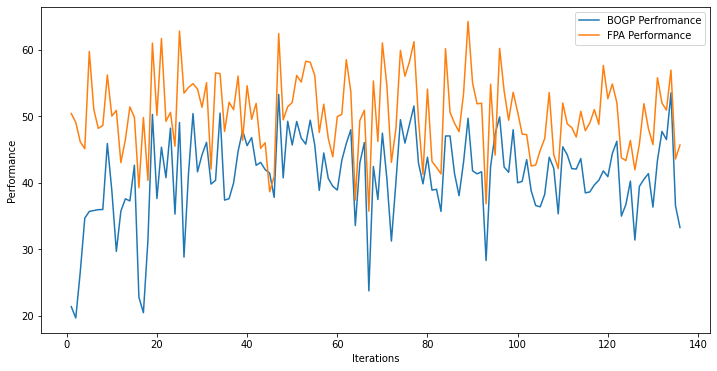

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.051898, actual=48.634
135


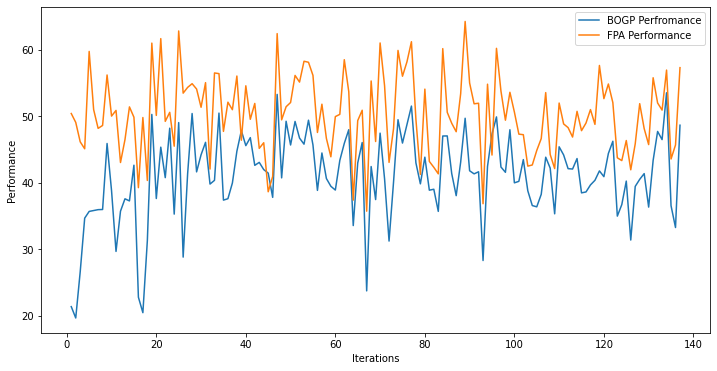

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.104490, actual=42.705
136


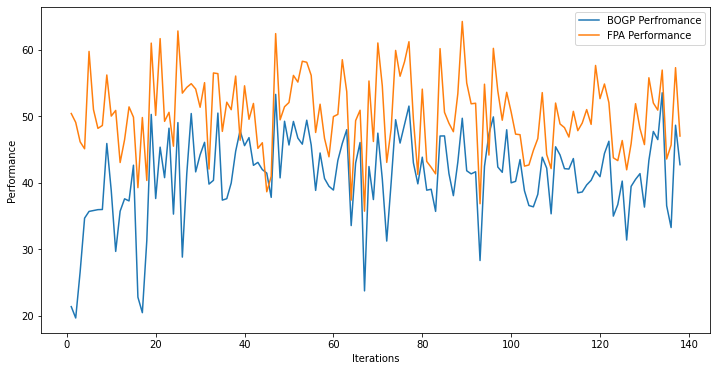

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.109646, actual=45.876
137


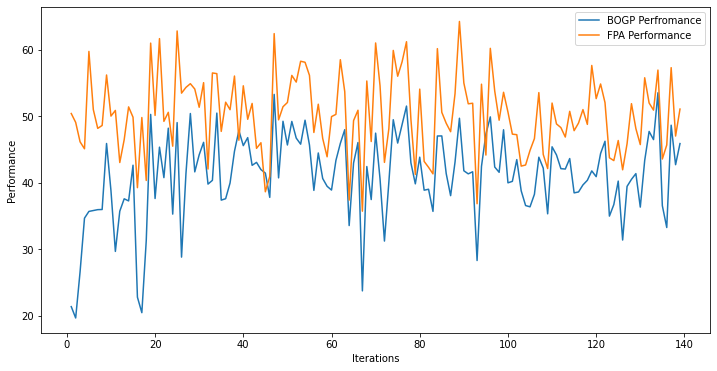

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.139575, actual=46.256
138


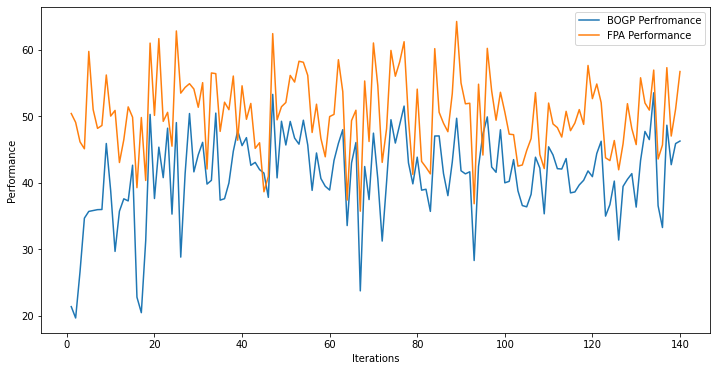

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.171972, actual=47.091
139


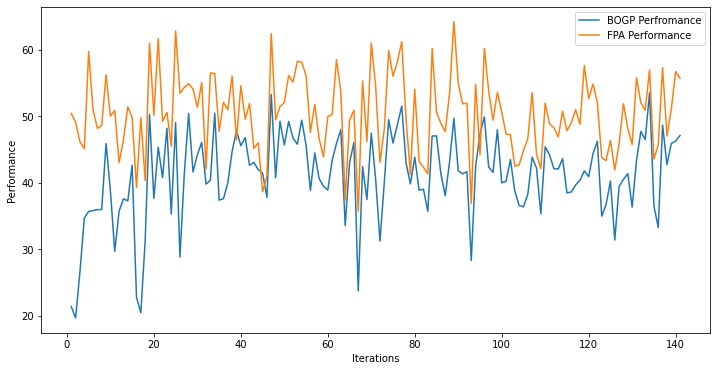

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.210266, actual=36.491
140


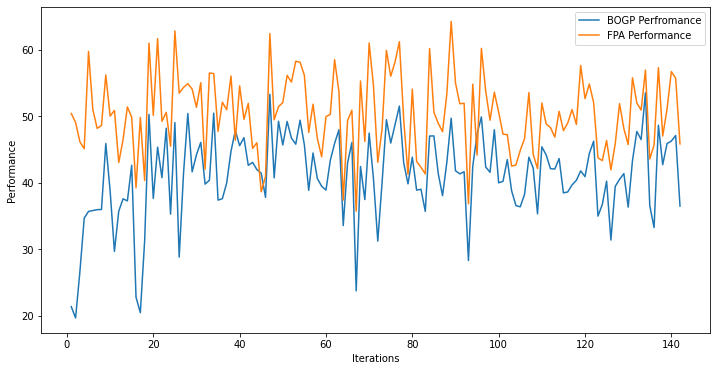

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.166009, actual=35.939
141


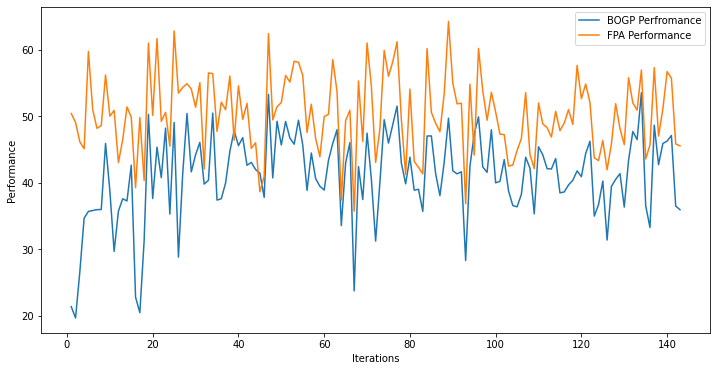

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.118124, actual=49.012
142


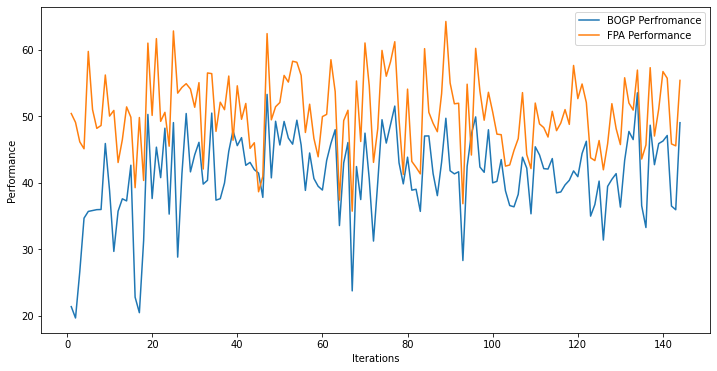

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.170244, actual=46.621
143


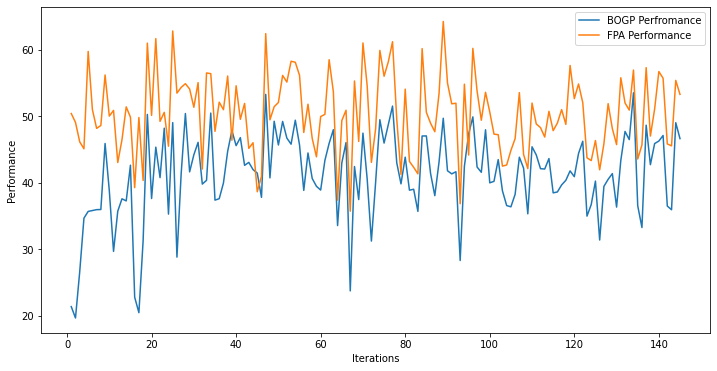

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.203909, actual=45.528
144


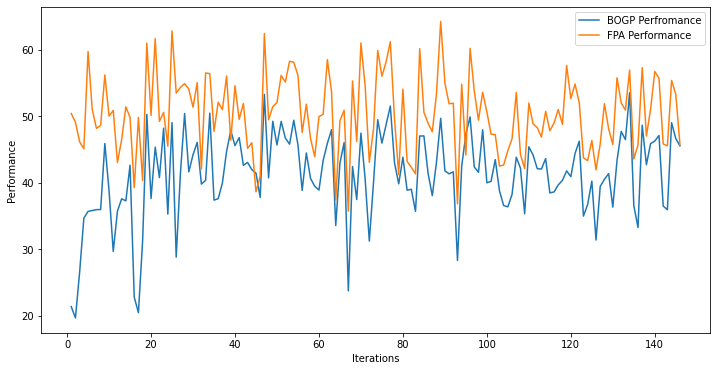

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.228996, actual=42.722
145


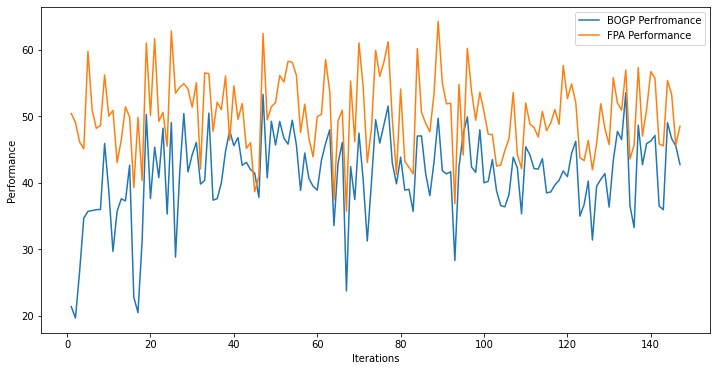

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.232987, actual=44.594
146


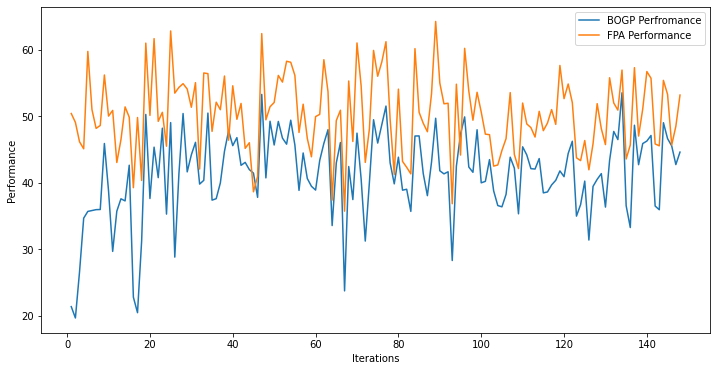

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.250662, actual=39.241
147


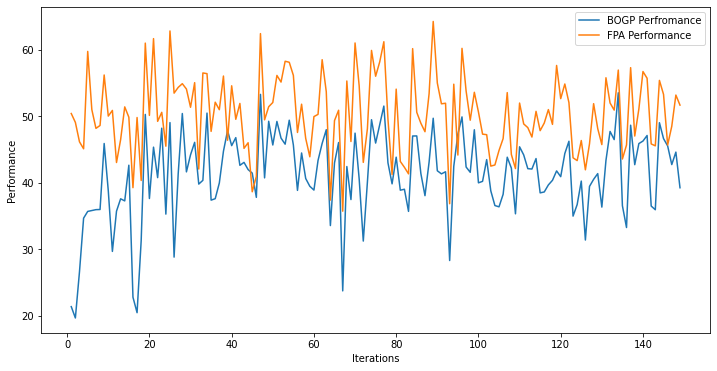

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.228818, actual=39.874
148


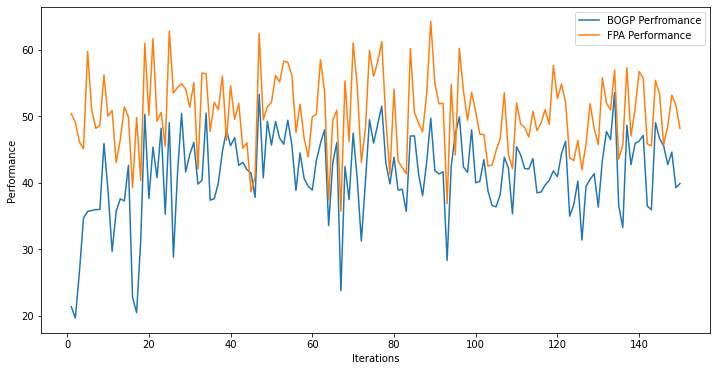

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.211936, actual=43.574
149


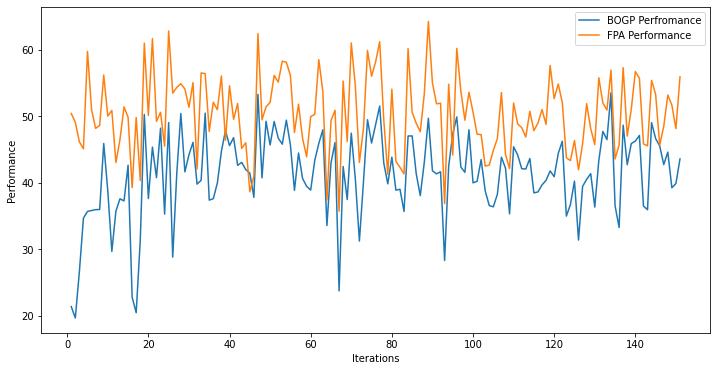

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.222055, actual=40.863
150


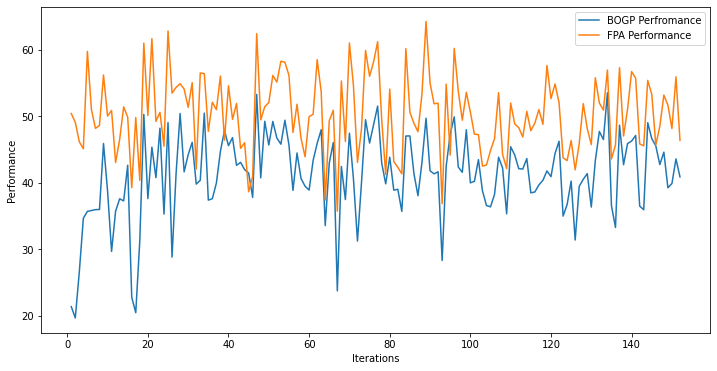

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.212592, actual=47.525
151


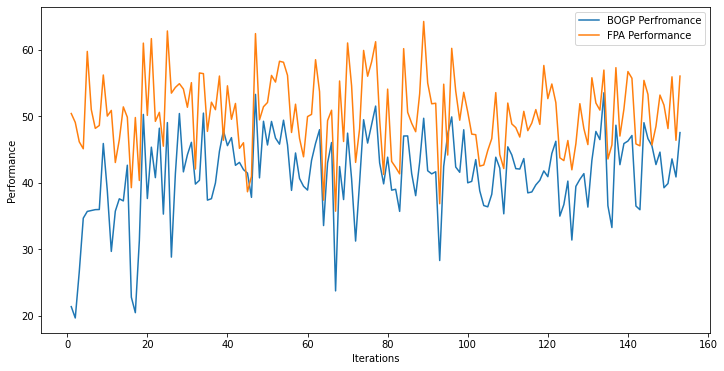

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.250366, actual=44.482
152


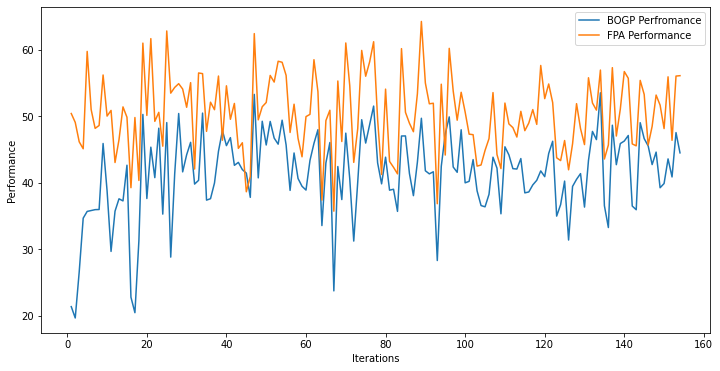

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.266376, actual=38.106
153


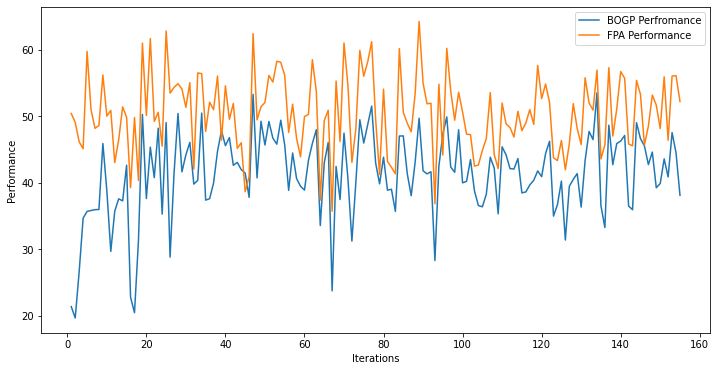

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.237267, actual=42.713
154


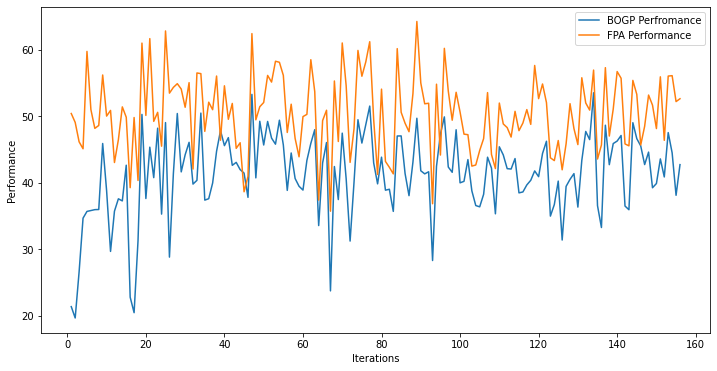

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.240862, actual=44.581
155


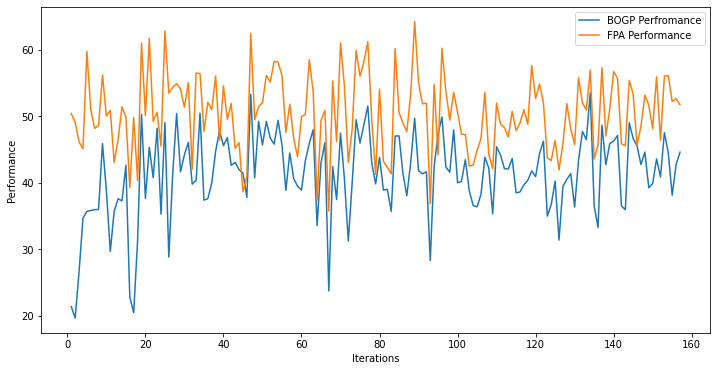

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.257279, actual=45.855
156


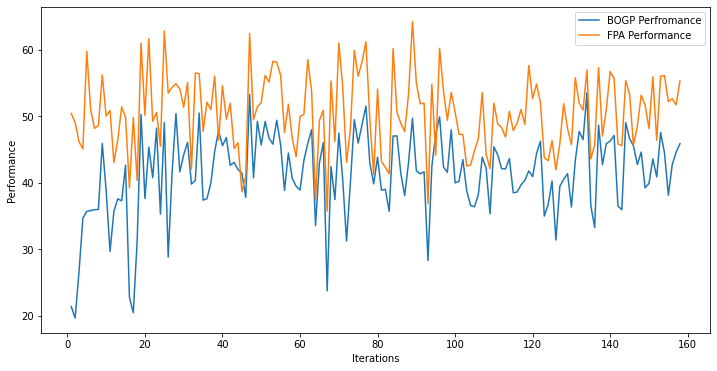

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.282139, actual=42.036
157


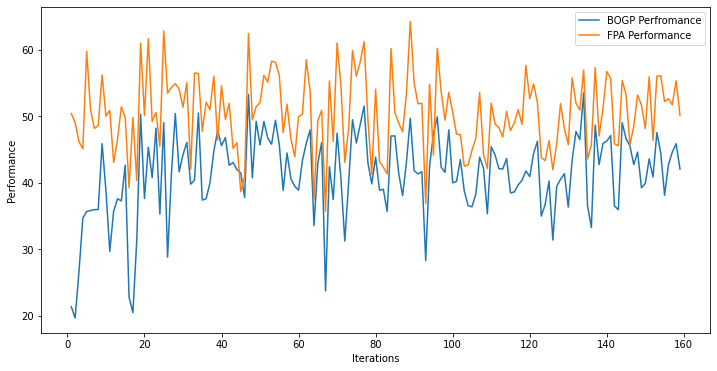

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.280728, actual=48.081
158


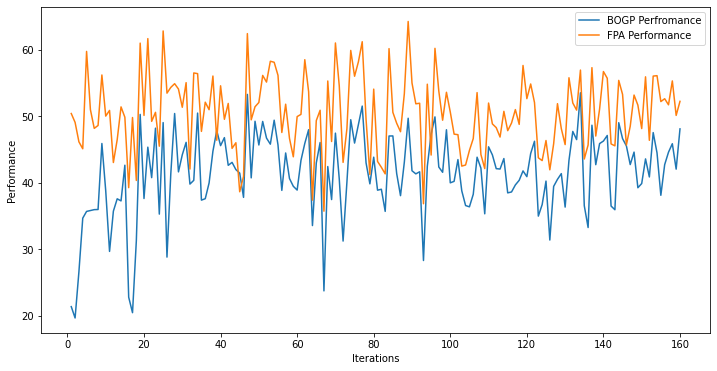

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.319957, actual=44.265
159


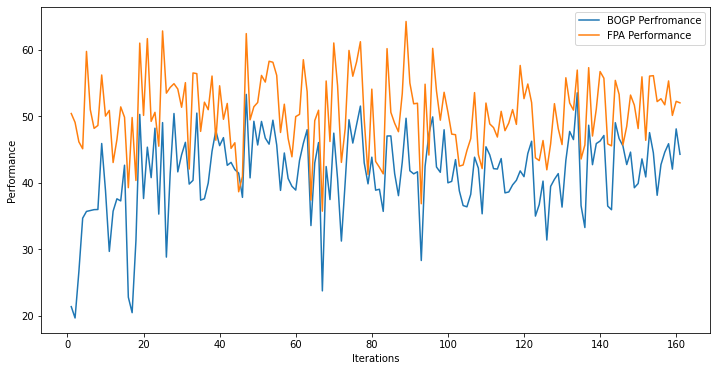

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.333282, actual=43.145
160


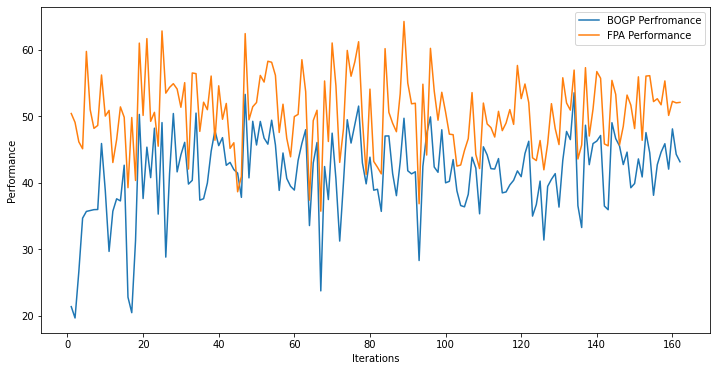

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.338965, actual=31.232
161


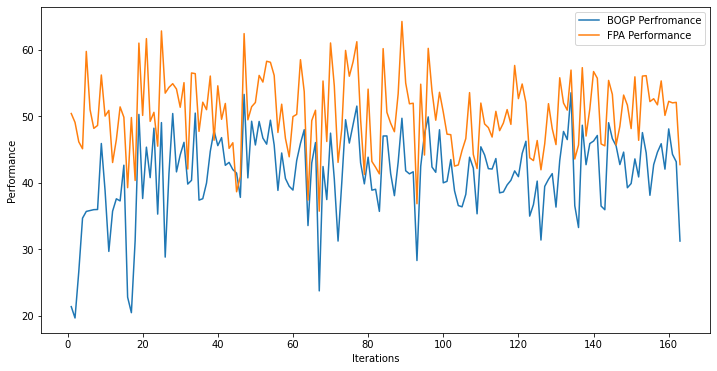

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.264082, actual=39.333
162


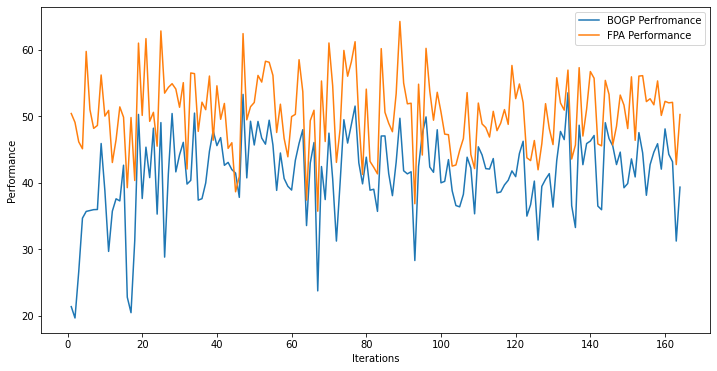

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.244897, actual=33.243
163


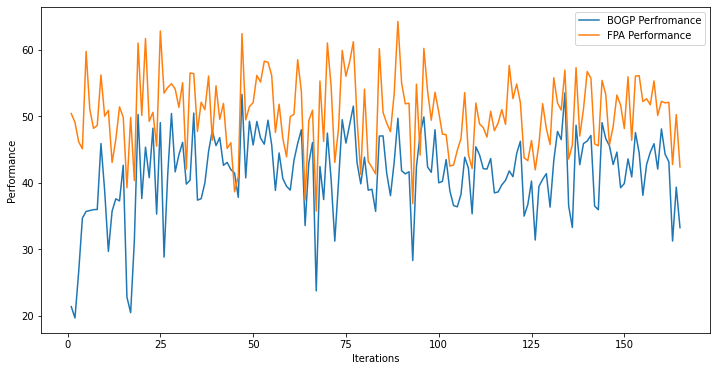

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.185287, actual=48.018
164


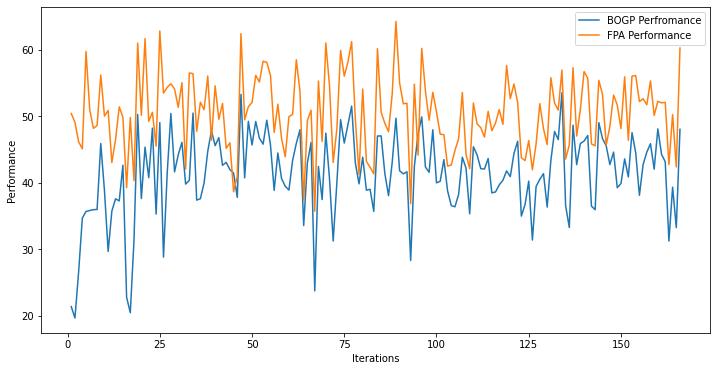

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.223192, actual=31.464
165


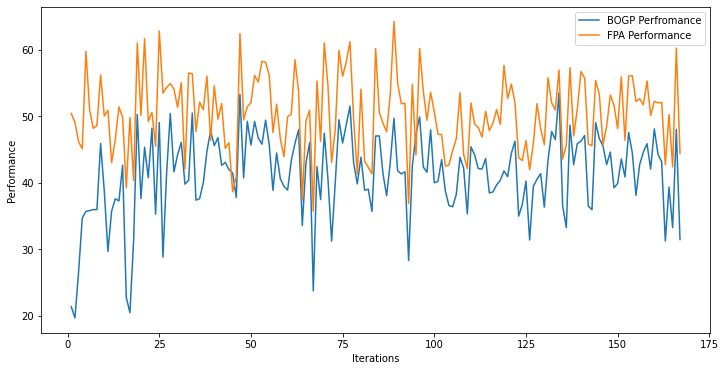

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.152660, actual=35.556
166


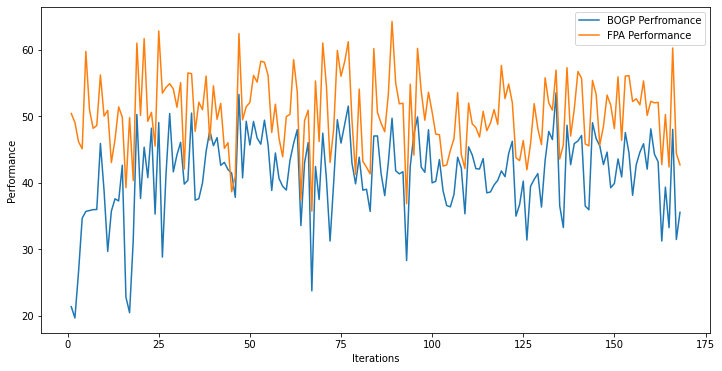

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.110070, actual=38.309
167


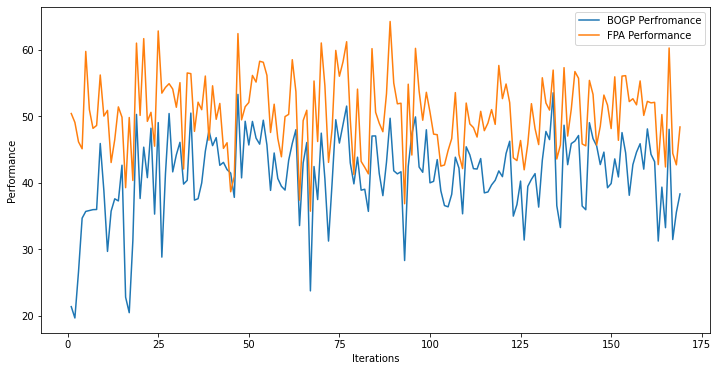

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.085891, actual=39.364
168


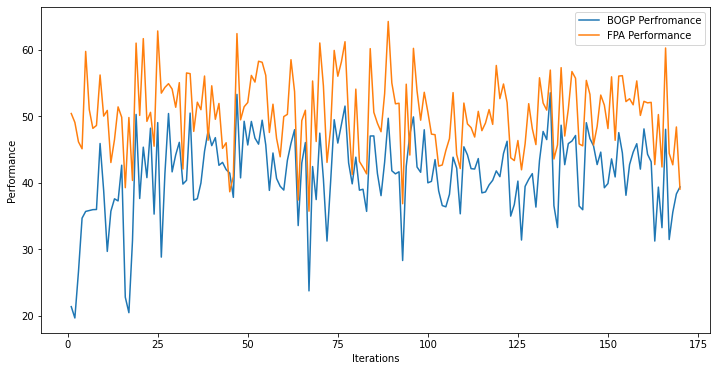

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.068783, actual=44.239
169


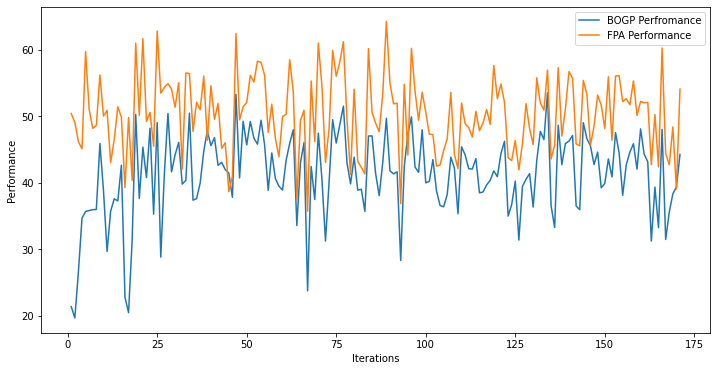

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.082662, actual=46.522
170


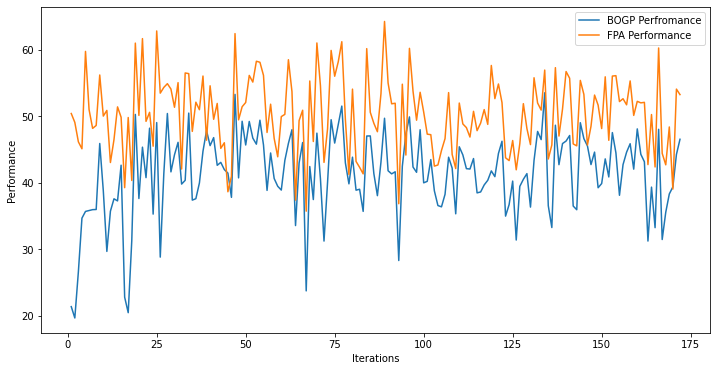

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.110544, actual=43.390
171


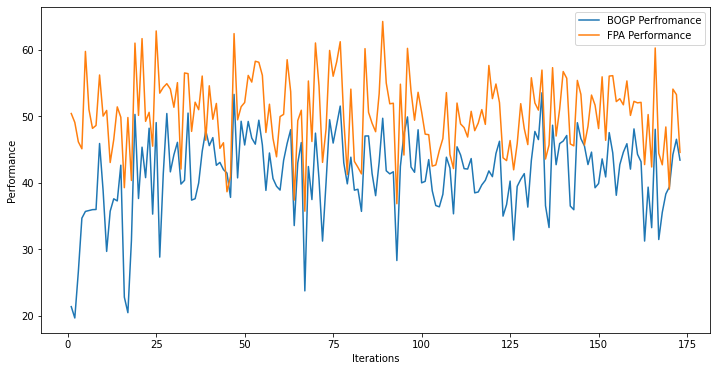

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.118720, actual=52.608
172


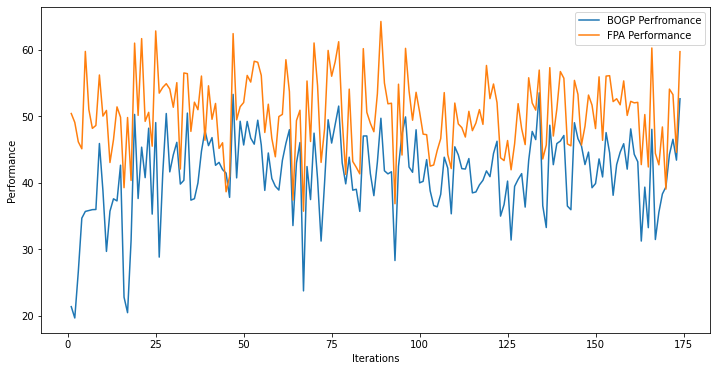

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.182893, actual=36.359
173


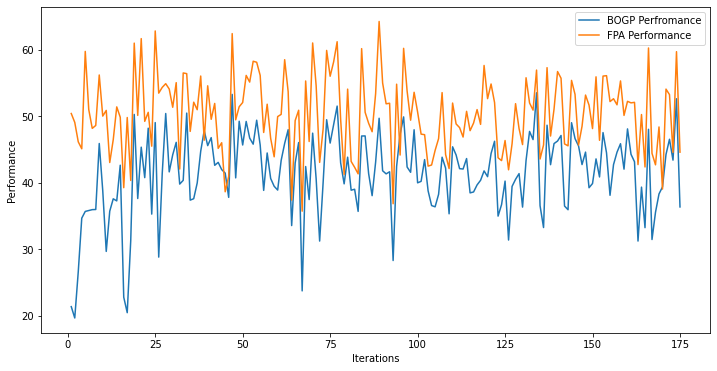

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.146986, actual=37.721
174


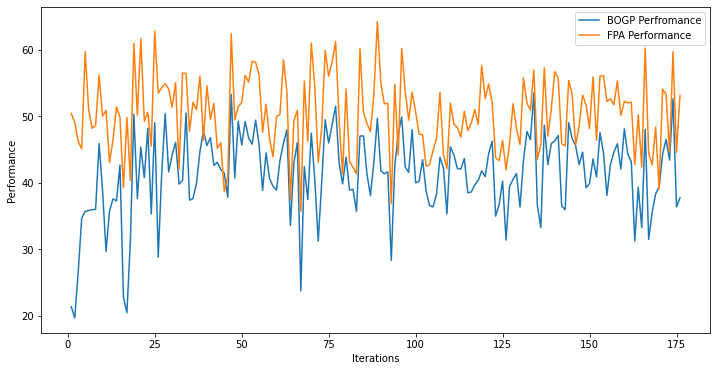

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.119977, actual=44.586
175


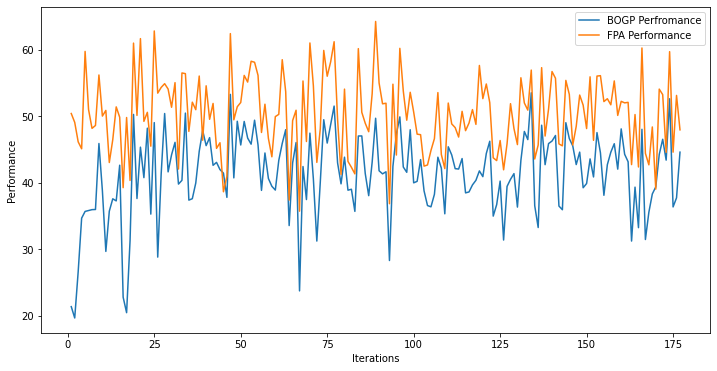

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.135128, actual=45.428
176


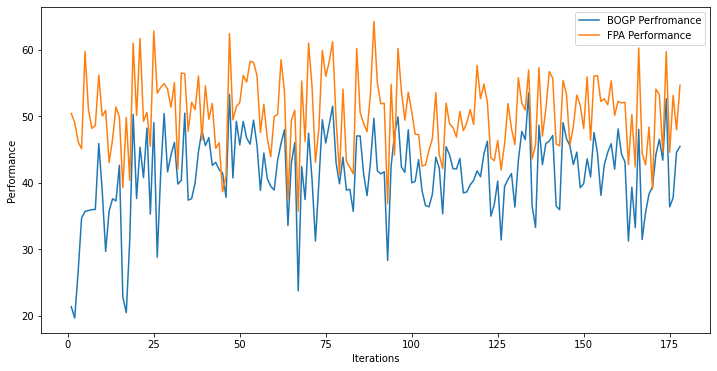

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.155143, actual=40.806
177


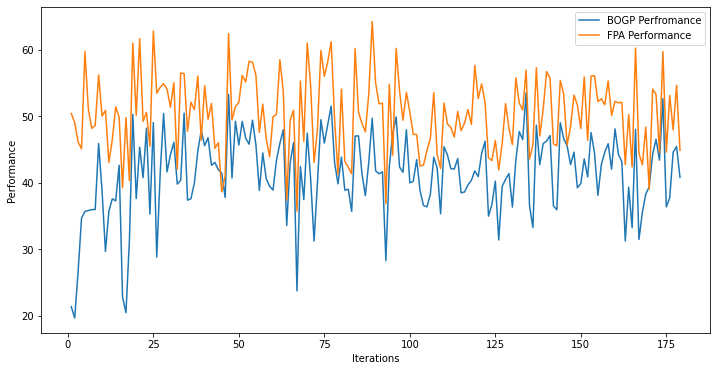

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.147243, actual=31.438
178


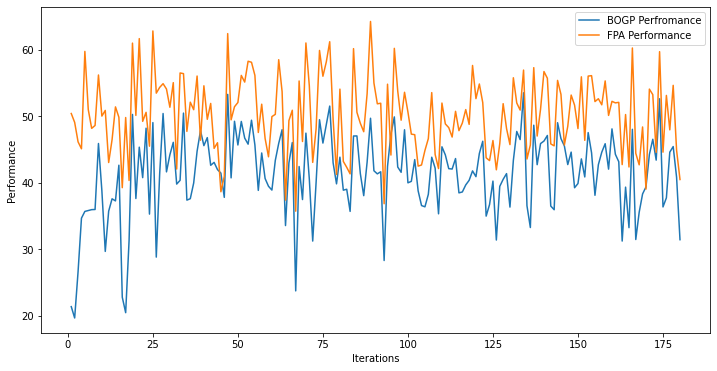

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.082573, actual=44.324
179


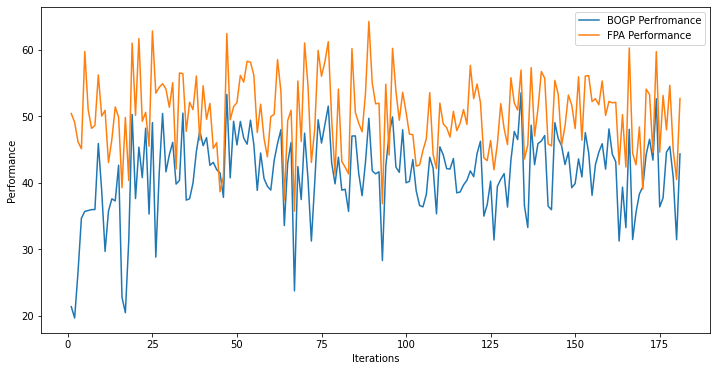

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.096042, actual=44.240
180


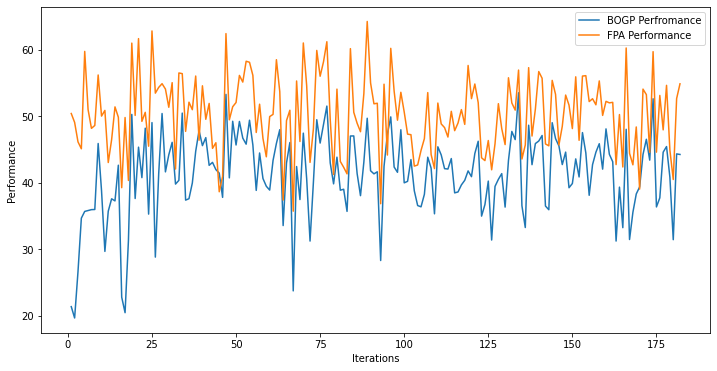

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.108856, actual=48.462
181


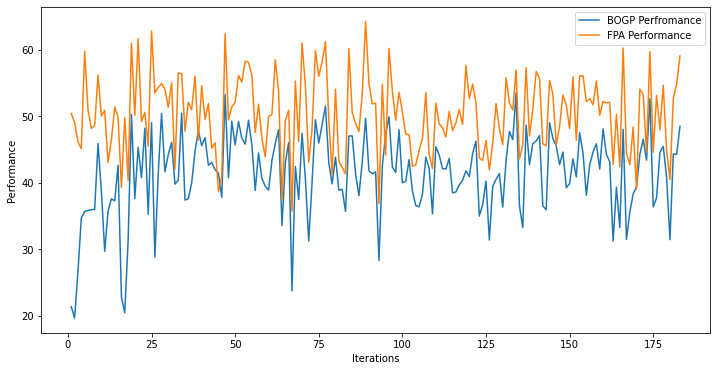

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.145993, actual=46.740
182


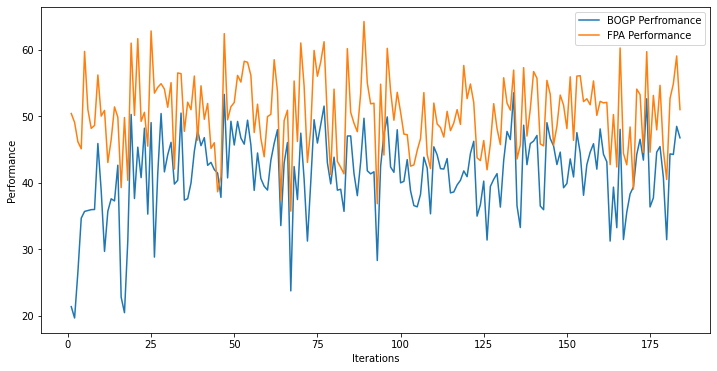

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.172807, actual=38.387
183


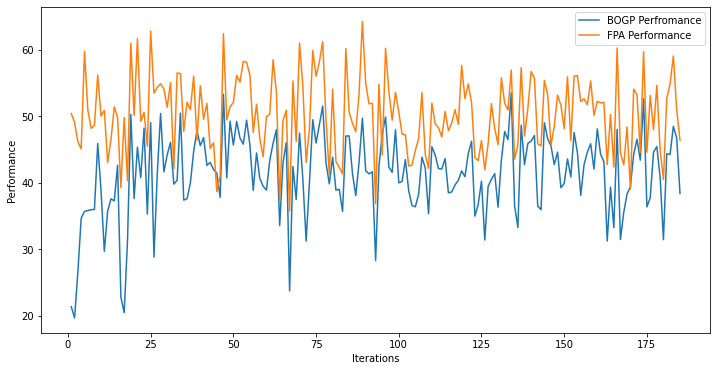

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.150951, actual=35.341
184


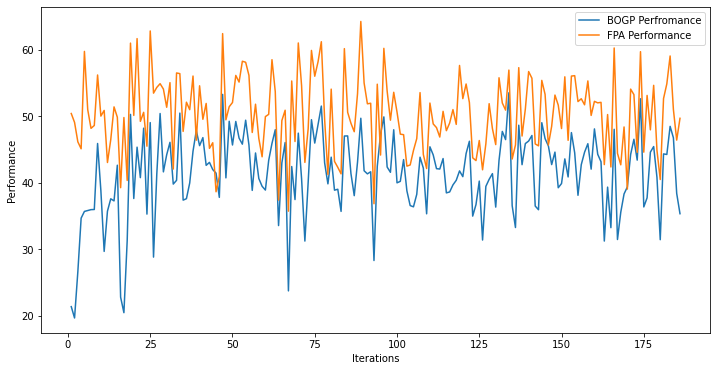

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.111545, actual=37.394
185


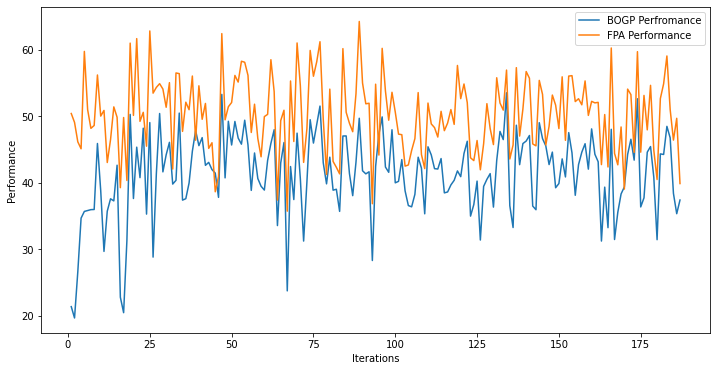

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.084543, actual=44.679
186


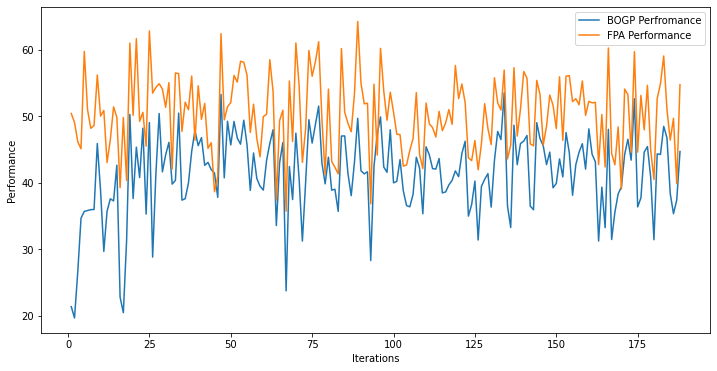

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.099467, actual=46.500
187


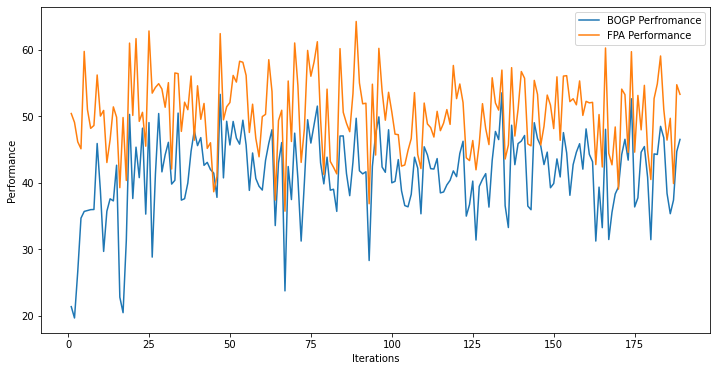

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.124438, actual=39.689
188


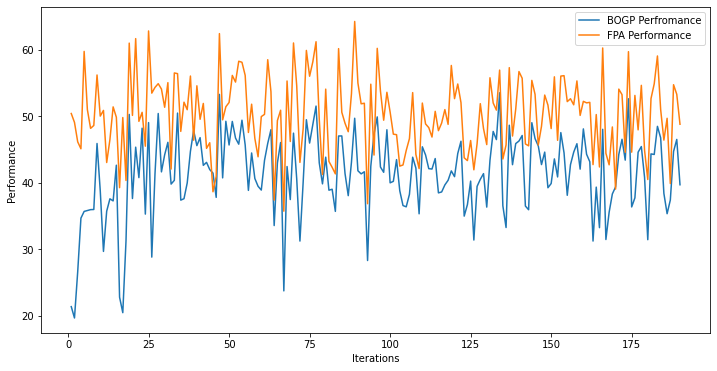

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.110864, actual=46.479
189


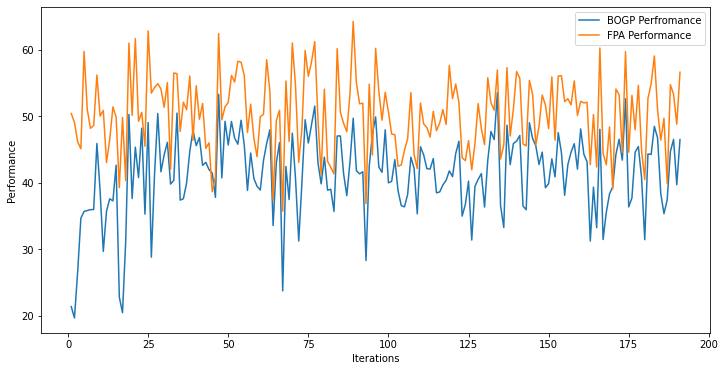

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.135377, actual=38.272
190


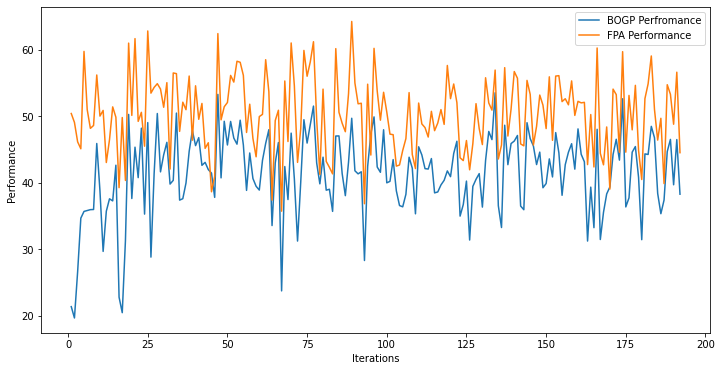

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.113932, actual=46.334
191


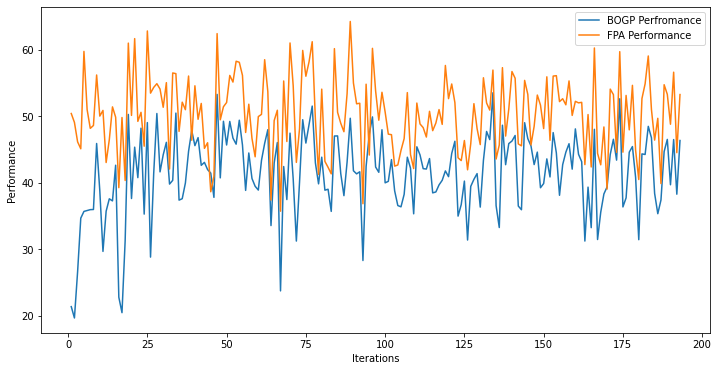

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.137365, actual=47.416
192


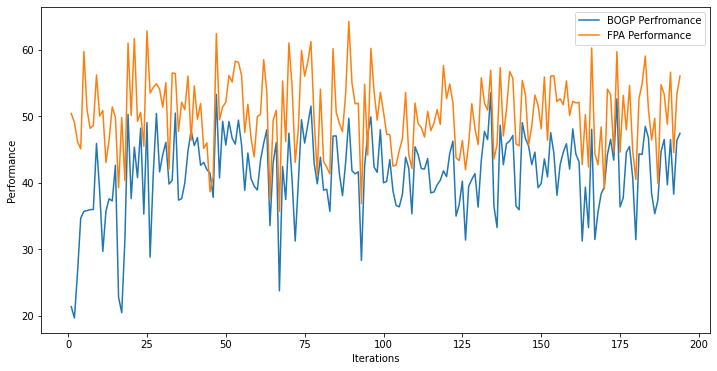

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.166422, actual=38.572
193


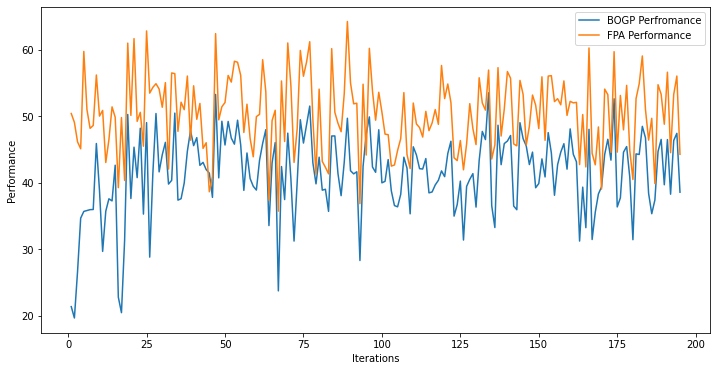

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.146817, actual=32.377
194


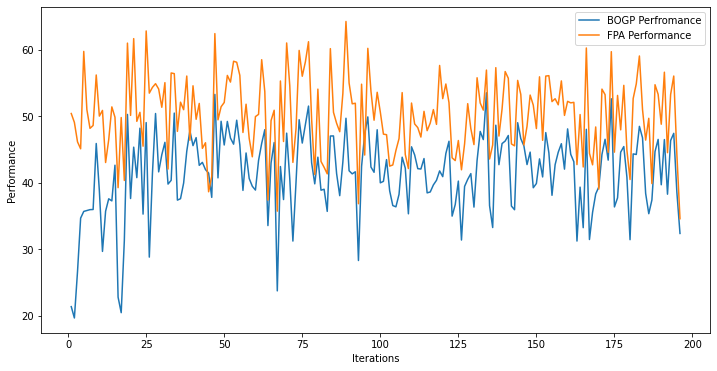

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.093097, actual=46.191
195


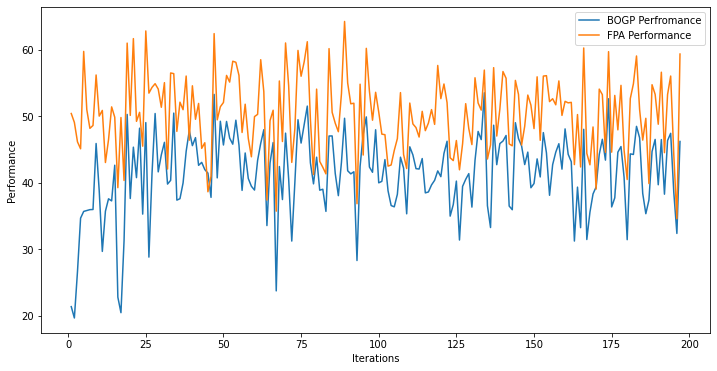

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.115358, actual=48.262
196


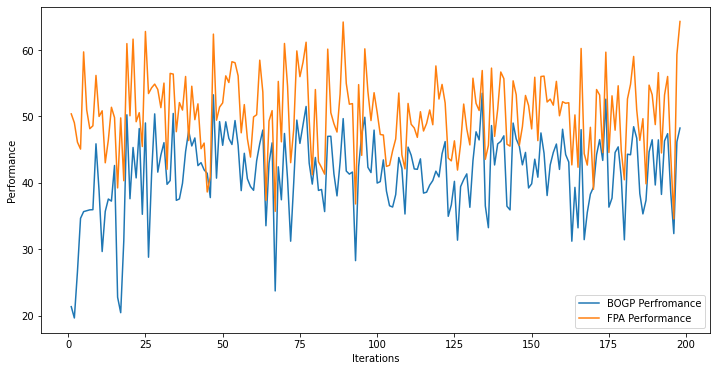

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.148405, actual=40.110
197


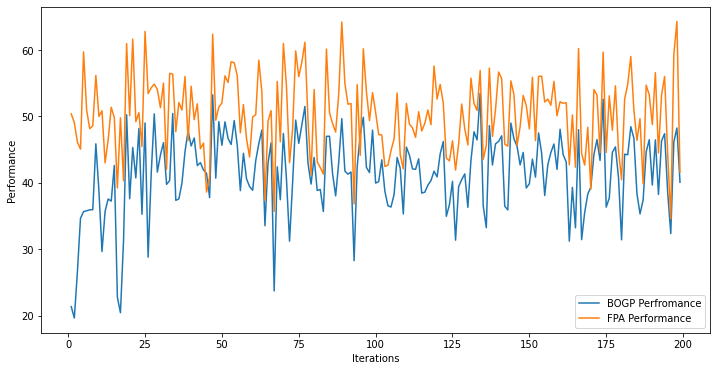

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.137622, actual=49.710
198


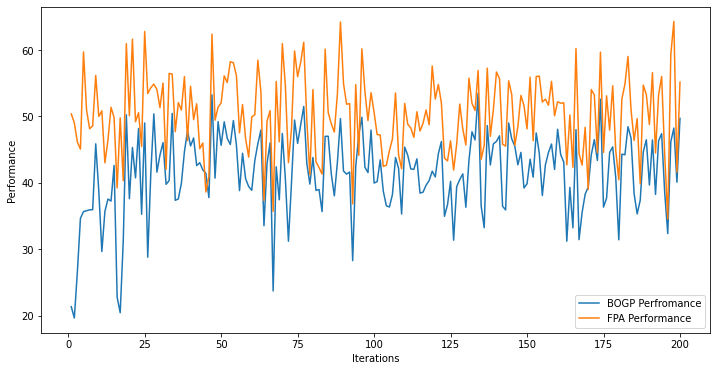

x_next is [ 40.  40.  40.  40. -31.  40. -31.  40.  40.  40.  40. -31.  40.  40.
 -31.  40. -31.  40.  40. -31.]
f()=42.177787, actual=34.600
199


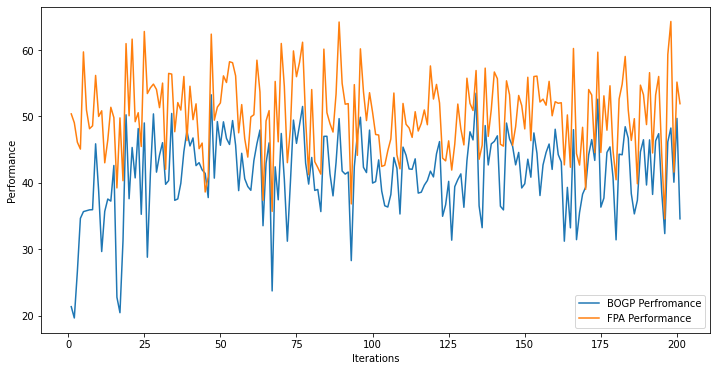

In [15]:
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel

X = 0 * np.ones([1,var], dtype = "float")
y = np.array([[objective(X[0].reshape((int)(var/number_of_cells), number_of_cells))]])

tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
y_FPA = np.array([[tr_FPA]])

kernels =  ConstantKernel(constant_value=200, constant_value_bounds = (1e-20, 1e20)) * Matern(length_scale=1, length_scale_bounds=(1e-20,1e20), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-20, 1e20)) 
model = GaussianProcessRegressor(kernel = kernels, n_restarts_optimizer=30)

model.fit(X, y)

for i in range(200):
  x_next = opt_acquisition(X, y, model, X.shape[0]+1)

  np.save("/content/drive/MyDrive/trainingx_BOGP_noisy_6.npy",X)
  np.save("/content/drive/MyDrive/trainingy_BOGP_noisy_6.npy",y)
  np.save("/content/drive/MyDrive/grad_trainingyFPA_BOGP_noisy_6.npy",y_FPA)
  
  tr = 0
  for l in range(1):
    tr = tr + objective(x_next.reshape((int)(var/number_of_cells), number_of_cells))
  tr = tr/1.0  
  actual = tr

  tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
  
  est, _ = surrogate(model, [x_next])
  print("x_next is", x_next)
  print('f()=%3f, actual=%.3f' % (est, actual))
  
  X = vstack((X, [x_next]))
  y = vstack((y, [[actual]]))
  y_FPA = vstack((y_FPA, [[tr_FPA]]))
  
  model.fit(X, y)
  
  print(i)
  pyplot.figure(figsize = (12, 6))

  pyplot.xlabel("Iterations")
  pyplot.ylabel("Performance")
  pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
  pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
  pyplot.legend(["BOGP Perfromance","FPA Performance"])
  pyplot.show()


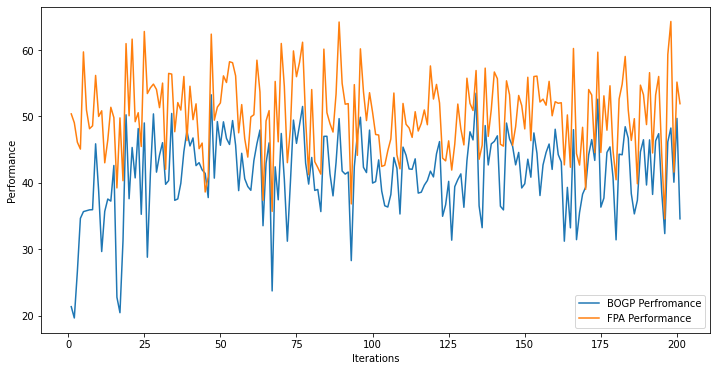

In [16]:
pyplot.figure(figsize = (12, 6))   
pyplot.xlabel("Iterations")
pyplot.ylabel("Performance")
pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
pyplot.legend(["BOGP Perfromance","FPA Performance"])
pyplot.show() 